In [2]:
pip install seaborn

Note: you may need to restart the kernel to use updated packages.


In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

In [30]:
file_path = "infer_caesar_0816.csv"

# CSV 파일을 데이터프레임으로 읽어들이기
df = pd.read_csv(file_path)
list_df=df.values.tolist()
print(list_df[:3])
# 데이터프레임 확인
print(df.head(10))

[['1qfn', 'ARG', 'A16', 0.24, 0.9132, 2, 8, 0.4532], ['7r8q', 'PRO', 'A149', 0.31, 0.3574, 3, 0, 0.0022], ['5i80', 'GLN', 'A127', 2.35, 1.8993, 23, 19, 0.2031]]
  proname resname  resno  label_int  ex_val  label_bin  ex_bin    MSE 
0    1qfn     ARG    A16       0.24  0.9132          2       8  0.4532
1    7r8q     PRO   A149       0.31  0.3574          3       0  0.0022
2    5i80     GLN   A127       2.35  1.8993         23      19  0.2031
3    2rh3     MET   A157       0.90  1.3859          8      15  0.2361
4    2vhw     VAL   A196       0.56  0.4771          5       6  0.0069
5    4b45     ARG   A324       0.02  0.4082          0       0  0.1507
6    2iuk     PRO  B1756       0.36  0.4081          3       0  0.0023
7    6z3y     ASN   B369       0.88  0.7097          8       6  0.0290
8    3w5n     PRO   A297       0.01  0.4785          0       0  0.2195
9    3sjf     TRP   A410       0.25  0.1967          2       0  0.0028


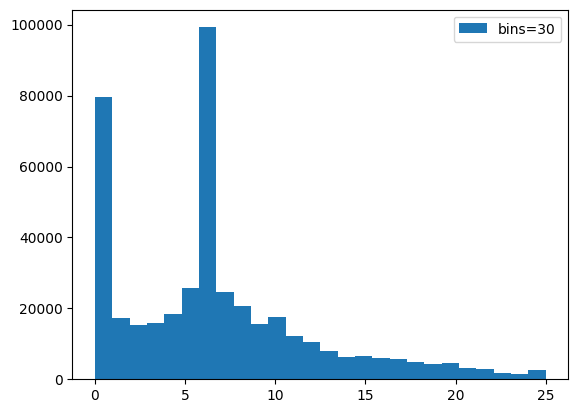

In [31]:

plt.hist(df['label_bin'],bins=26 ,label='bins=30')

plt.legend()
plt.show()

[0          8
5          0
28         0
37        17
66        25
          ..
430342     0
430352     0
430353    25
430399     0
430405     0
Name: ex_bin, Length: 23871, dtype: int64, 0          8
5          0
28         0
37        17
66        25
          ..
430342     0
430352     0
430353    25
430399     0
430405     0
Name: ex_bin, Length: 23871, dtype: int64, 0          8
5          0
28         0
37        17
66        25
          ..
430342     0
430352     0
430353    25
430399     0
430405     0
Name: ex_bin, Length: 23871, dtype: int64, 0          8
5          0
28         0
37        17
66        25
          ..
430342     0
430352     0
430353    25
430399     0
430405     0
Name: ex_bin, Length: 23871, dtype: int64, 0          8
5          0
28         0
37        17
66        25
          ..
430342     0
430352     0
430353    25
430399     0
430405     0
Name: ex_bin, Length: 23871, dtype: int64, 0          8
5          0
28         0
37        17
66        25
    

ValueError: shape mismatch: objects cannot be broadcast to a single shape.  Mismatch is between arg 0 with shape (27,) and arg 1 with shape (23871, 23871).

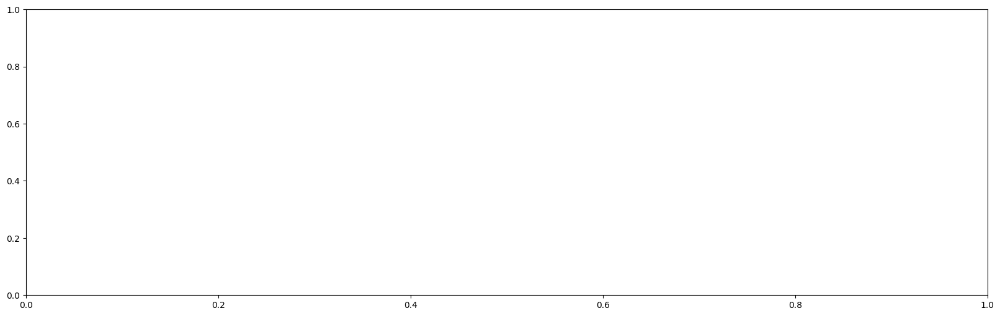

In [38]:
data=df.groupby('resname')
#print(data)
#data=df
row_index = 0  # 시각화할 행의 인덱스

# 막대 그래프를 그리는 함수
def plot_bar_comparison(pred_data, label_data,name):
    labels = [f'{i}' for i in range(27)]  # 예측 레이블의 라벨
    x = np.arange(len(labels))  # x 축 값
    width = 0.35  # 막대의 너비

    fig, ax = plt.subplots(figsize=(20, 6))
    rects1 = ax.bar(x - width/2, pred_data, width, label='Predictions')
    rects2 = ax.bar(x + width/2, label_data, width, label='Labels')
    
    for rect, pred, label in zip(rects1, pred_data, label_data):
        height=rect.get_height()
        ax.text(rect.get_x() + rect.get_width()/2, height, f'{pred}', ha='center', va='bottom')
    
    for rect, label in zip(rects2, label_data):
        height=rect.get_height()
        ax.text(rect.get_x() + rect.get_width()/2, height, f'{label}', ha='center', va='bottom')

    ax.set_xlabel('Labels')
    ax.set_ylabel('Count')
    ax.set_title(f'Prediction vs. Label Counts {name}')
    ax.set_xticks(x)
    ax.set_xticklabels(labels)
    ax.legend()

    plt.show()

# 막대 그래프 그리기
# 시각화할 행의 데이터 추출
for name,grouped in data:
    #print(name)
    #print(grouped)
    pred_data = [grouped['ex_bin'] for i in range(len(grouped))]
    print(pred_data)
    label_data = [grouped['label_bin'] for i in range(len(grouped))]
    #print(label_data)
    
    plot_bar_comparison(pred_data, label_data,name)
  
    print()

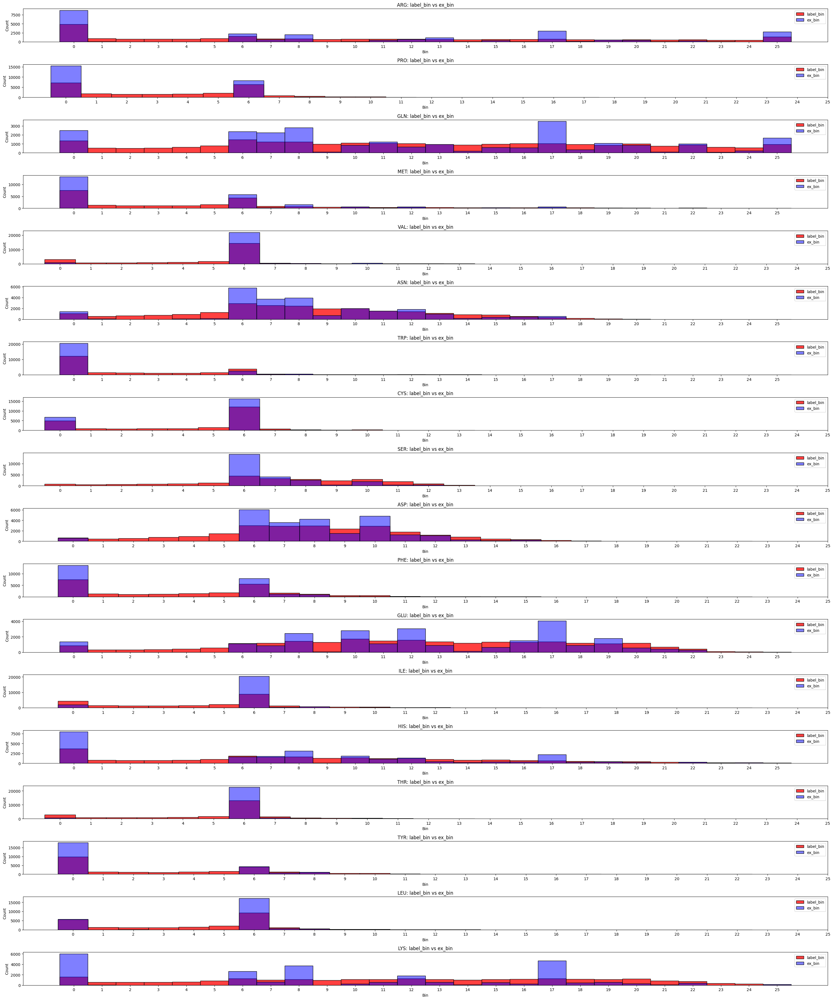

In [44]:
df_test = df

# 아미노산 별로 label_bin과 ex_bin을 비교하는 플롯을 그리는 함수
def plot_bin_comparison(df):
    unique_resnames = df["resname"].unique()
    plt.figure(figsize=(30,36))
    
    for i, resname in enumerate(unique_resnames):
        plt.subplot(len(unique_resnames), 1, i+1)
        subset = df[df["resname"] == resname]
        sns.histplot(subset["label_bin"], bins=range(27), color="red", label="label_bin", kde=False, discrete=True)
        sns.histplot(subset["ex_bin"], bins=range(27), color="blue", label="ex_bin", kde=False, discrete=True, alpha=0.5)
 
        plt.title(f'{resname}: label_bin vs ex_bin')
        plt.xlabel('Bin')
        plt.ylabel('Count')
        plt.xticks(range(26))
        plt.legend()
    
    plt.tight_layout()
    plt.show()

# 플롯 그리기
plot_bin_comparison(df_test)

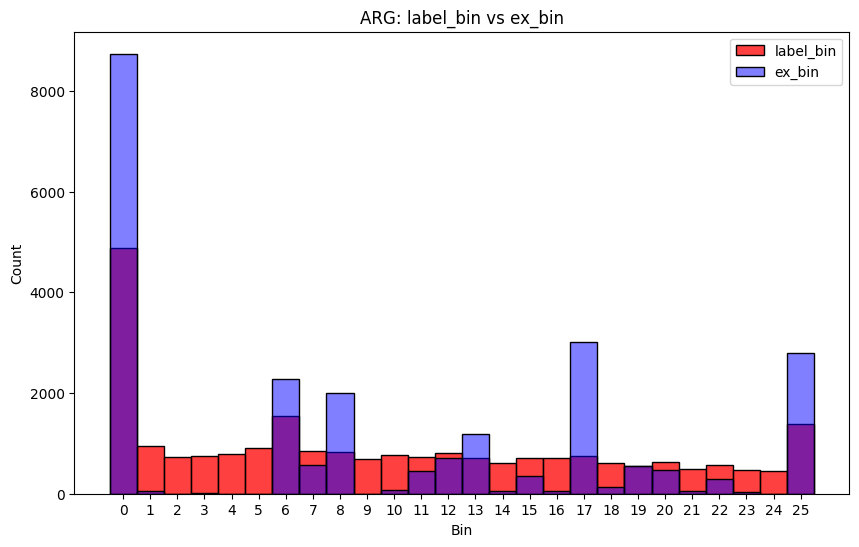

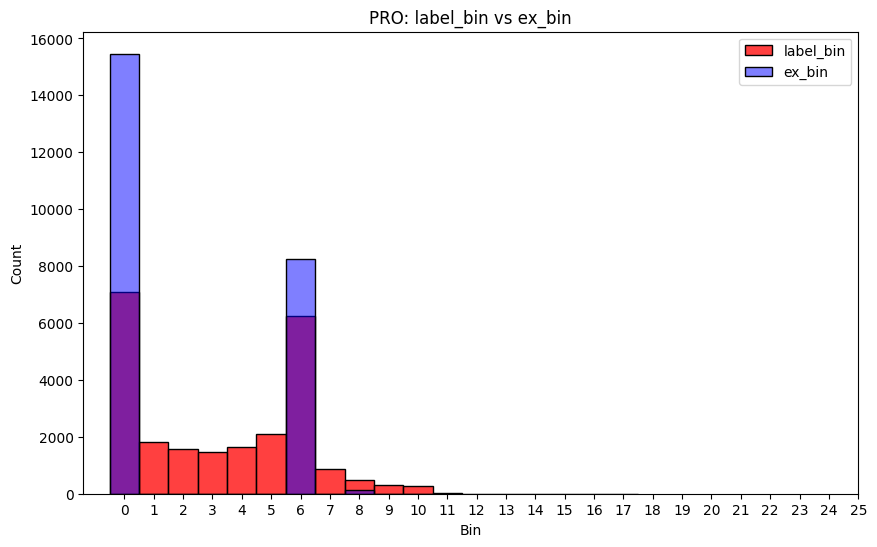

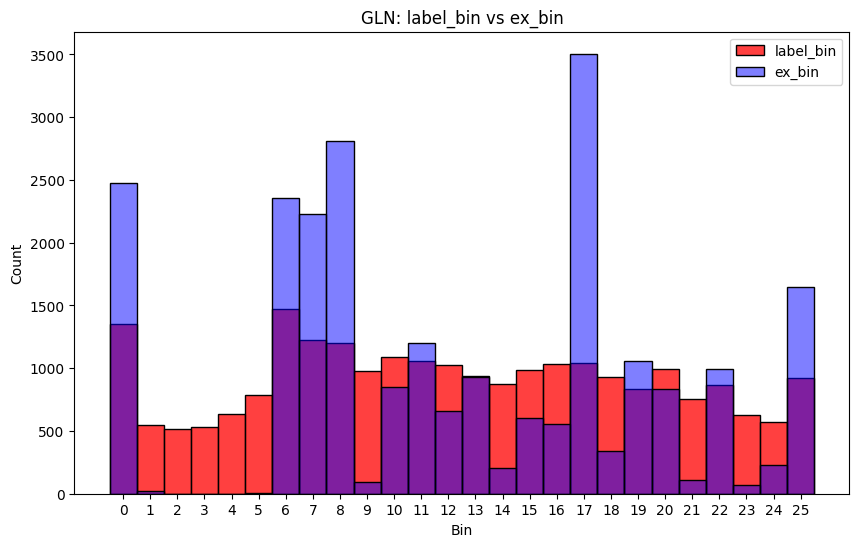

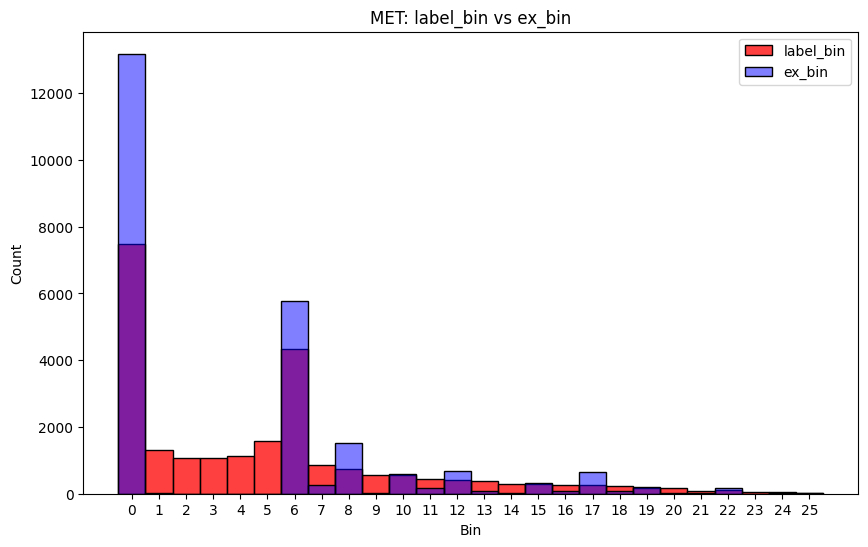

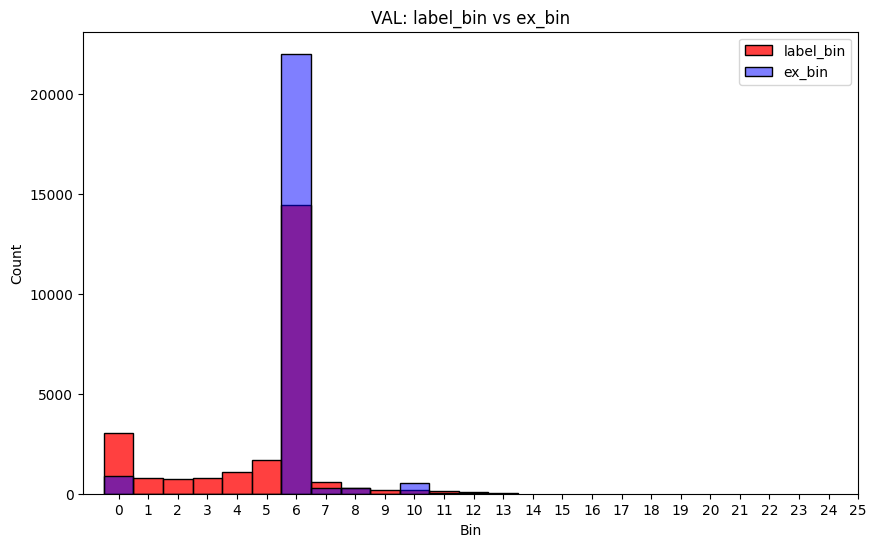

...

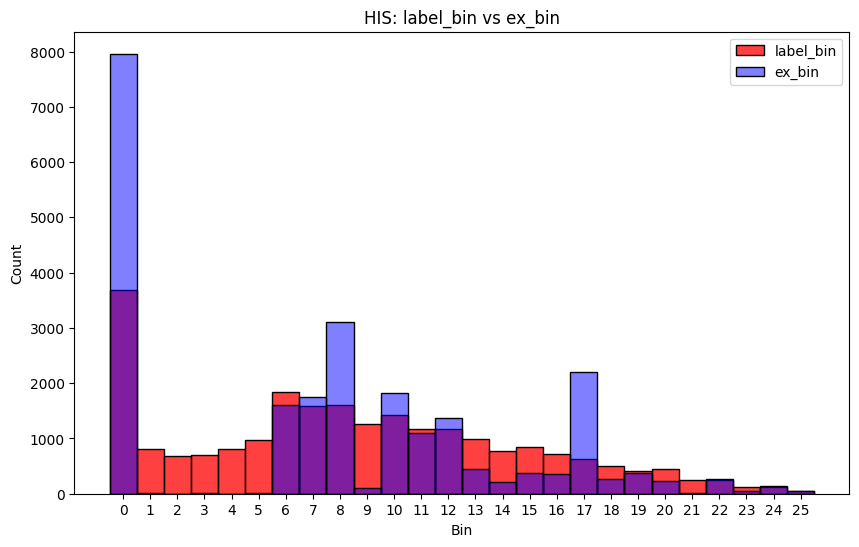

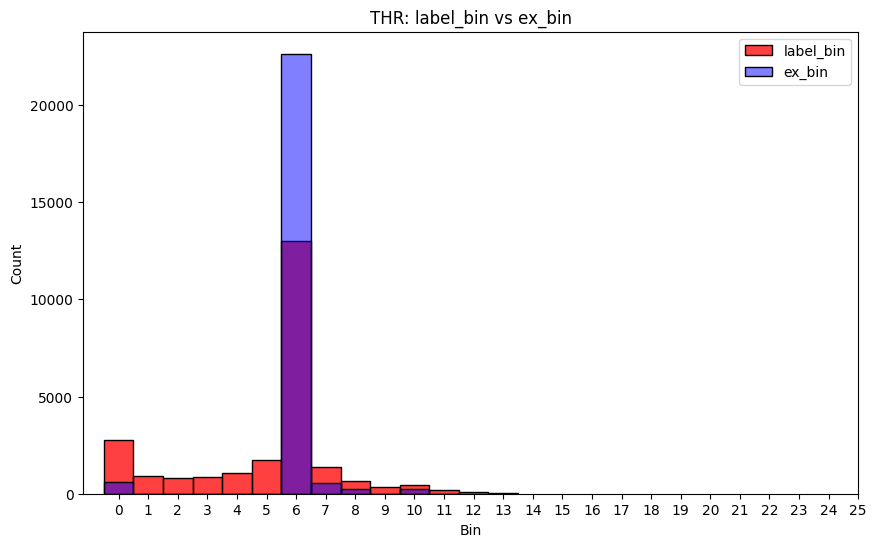

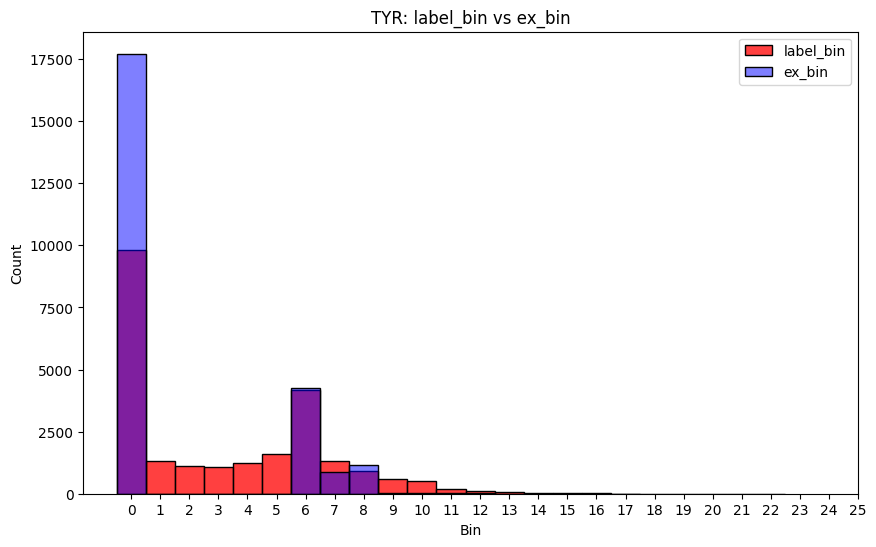

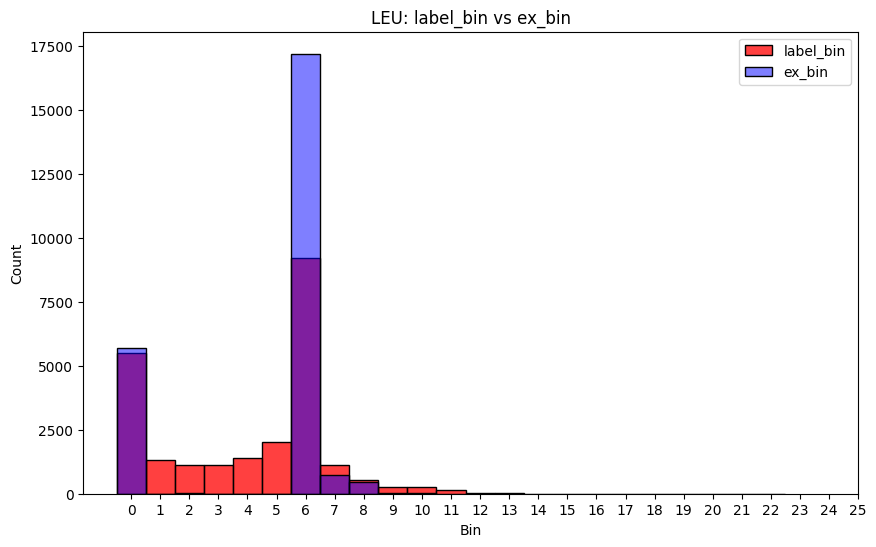

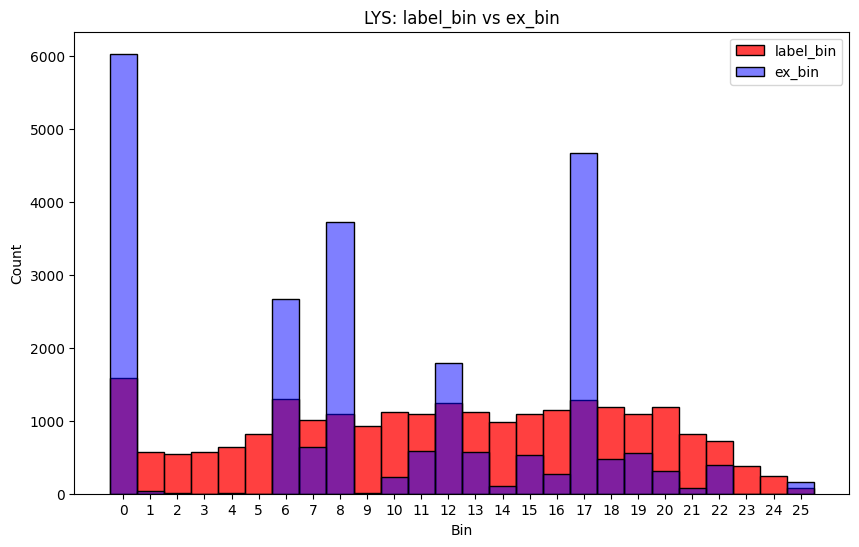

In [51]:
def plot_bin_comparison_separate(df):
    unique_resnames = df["resname"].unique()
    
    for resname in unique_resnames:
        subset = df[df["resname"] == resname]
        
        plt.figure(figsize=(10, 6))
        sns.histplot(subset["label_bin"], bins=range(27), color="red", label="label_bin", kde=False, discrete=True)
        sns.histplot(subset["ex_bin"], bins=range(27), color="blue", label="ex_bin", kde=False, discrete=True, alpha=0.5)
        plt.title(f'{resname}: label_bin vs ex_bin')
        plt.xlabel('Bin')
        plt.ylabel('Count')
        plt.xticks(range(26))
        plt.legend()
        plt.show()

# 플롯 그리기
plot_bin_comparison_separate(df)

### data distribution

In [49]:
file_path = "total_dts.csv"

# CSV 파일을 데이터프레임으로 읽어들이기
df_total = pd.read_csv(file_path)
list_df_total=df.values.tolist()
print(list_df_total[:3])
# 데이터프레임 확인
print(df_total.head(10))

[['1qfn', 'ARG', 'A16', 0.24, 0.9132, 2, 8, 0.4532], ['7r8q', 'PRO', 'A149', 0.31, 0.3574, 3, 0, 0.0022], ['5i80', 'GLN', 'A127', 2.35, 1.8993, 23, 19, 0.2031]]
  proname resname  resno  label_int  ex_int  label_bin  ex_bin     MSE
0    4q7q     GLN    A65       1.10  0.5039       11.0     0.0  0.3553
1    6um1     TYR  A2124       0.42  0.4133        4.0     0.0  0.0000
2    7wh0     MET   A241       0.57  0.2881        5.0     0.0  0.0795
3    3r5s     TRP   A100       0.63  0.1609        6.0     0.0  0.2201
4    7qan     GLU   A214       0.55  0.6111        5.0     6.0  0.0037
5    4h87     THR   A253       0.69  0.5832        6.0     6.0  0.0114
6    7wpo     LYS   A553       0.85  0.7172        8.0     6.0  0.0176
7    7w5q     SER     A6       0.74  0.8768        7.0     8.0  0.0187
8    8d89     PRO   A165       0.38  0.3467        3.0     0.0  0.0011
9    1qb6     SER   A104       0.60  0.8781        6.0    10.0  0.0773


In [1]:
def plot_bin_comparison(df):
    unique_resnames = df["resname"].unique()
    
    for resname in unique_resnames:
        subset = df[df["resname"] == resname]
        
        plt.figure(figsize=(10, 6))
        sns.histplot(subset["label_bin"], bins=range(28), color="red", label="label_bin", kde=False, discrete=True)
        plt.title(f'{resname}: label_bin')
        plt.xlabel('Bin')
        plt.ylabel('Count')
        plt.xticks(range(27))
        plt.legend()
        plt.show()

# 플롯 그리기
plot_bin_comparison(df_total)

NameError: name 'df_total' is not defined

### data balancing

In [ ]:
import random
group_resname=df.groupby('resname')

for name, ex in group_resname:
    print(name)
    count0=[]
    count1=[]
    for idx, row in ex.iterrows():   
        if row['label_bin']==0:
            count0.append(row['proname']+row['resname']+row['resno'])
        else:
            count1.append(row['proname']+row['resname']+row['resno'])

        if len(count0) > len(count1):
            count0=random.sample(count0, len(count1))

        print(len(count0))
        print(len(count1))
        
        f= open("{%s}_data_balance.txt"%name,"w+")
    
        for data in count0:
            f.write(data)
    
        for data in count1:
            f.write(data)
        f.close()

#### Scatter Plot

In [52]:
file_path = "infer_caesar_0816.csv"

# CSV 파일을 데이터프레임으로 읽어들이기
df_s = pd.read_csv(file_path)
list_df=df_s.values.tolist()
print(list_df[:3])
# 데이터프레임 확인
print(df_s.head(10))

[['1qfn', 'ARG', 'A16', 0.24, 0.9132, 2, 8, 0.4532], ['7r8q', 'PRO', 'A149', 0.31, 0.3574, 3, 0, 0.0022], ['5i80', 'GLN', 'A127', 2.35, 1.8993, 23, 19, 0.2031]]
  proname resname  resno  label_int  ex_val  label_bin  ex_bin    MSE 
0    1qfn     ARG    A16       0.24  0.9132          2       8  0.4532
1    7r8q     PRO   A149       0.31  0.3574          3       0  0.0022
2    5i80     GLN   A127       2.35  1.8993         23      19  0.2031
3    2rh3     MET   A157       0.90  1.3859          8      15  0.2361
4    2vhw     VAL   A196       0.56  0.4771          5       6  0.0069
5    4b45     ARG   A324       0.02  0.4082          0       0  0.1507
6    2iuk     PRO  B1756       0.36  0.4081          3       0  0.0023
7    6z3y     ASN   B369       0.88  0.7097          8       6  0.0290
8    3w5n     PRO   A297       0.01  0.4785          0       0  0.2195
9    3sjf     TRP   A410       0.25  0.1967          2       0  0.0028


ARG


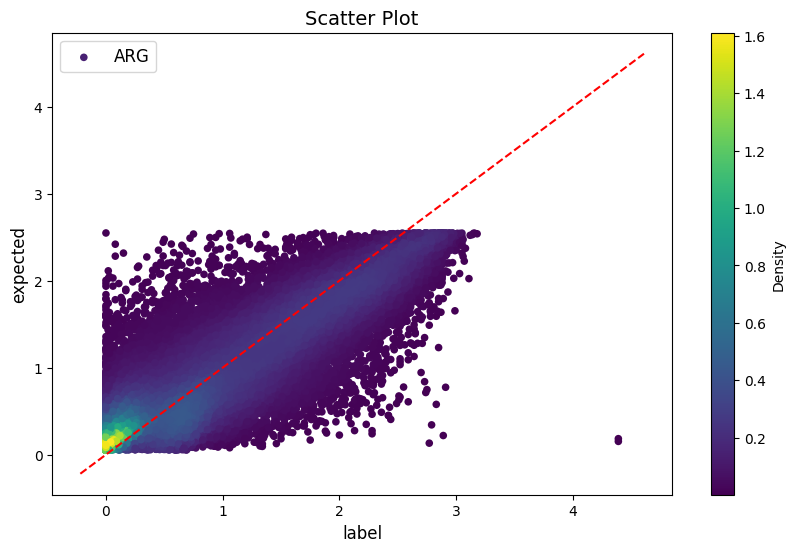

ASN


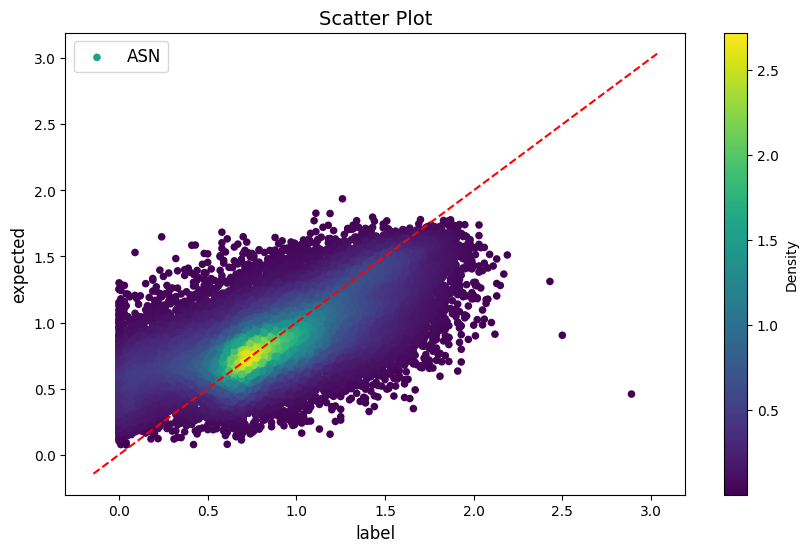

ASP


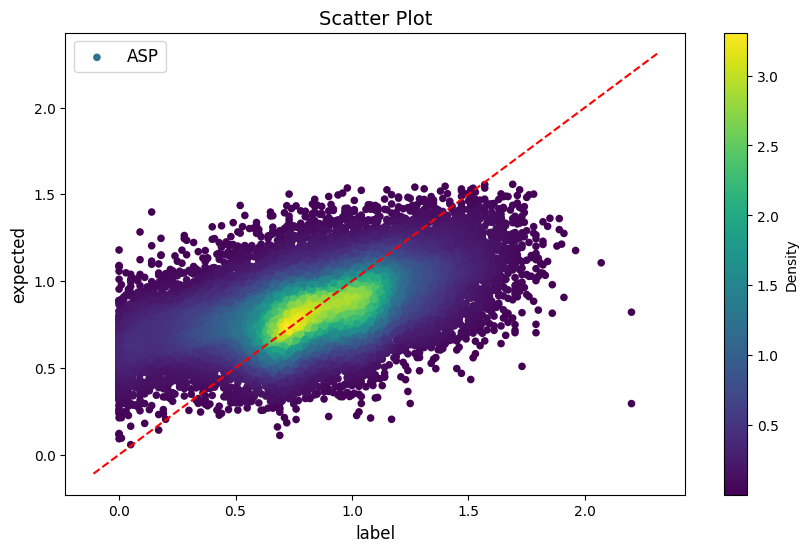

CYS


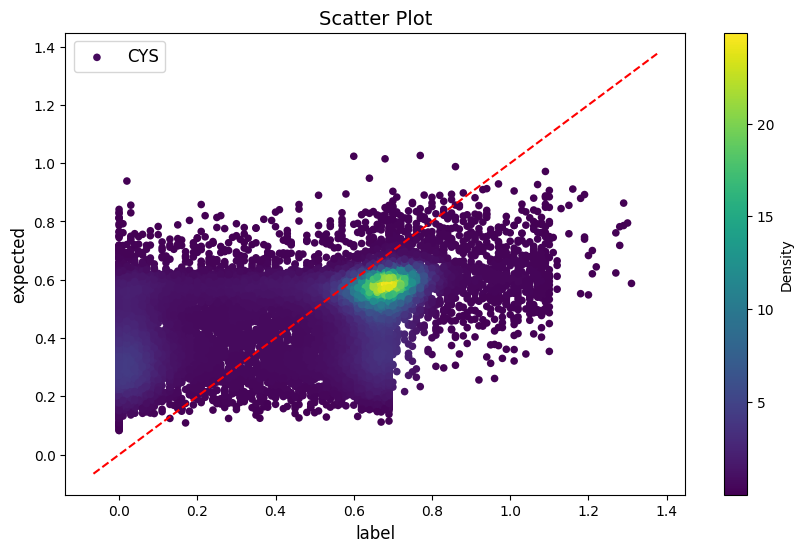

GLN


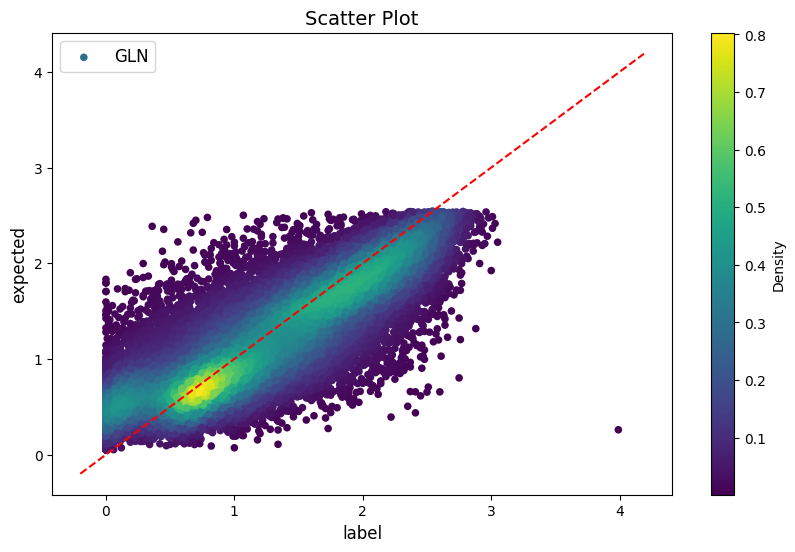

GLU


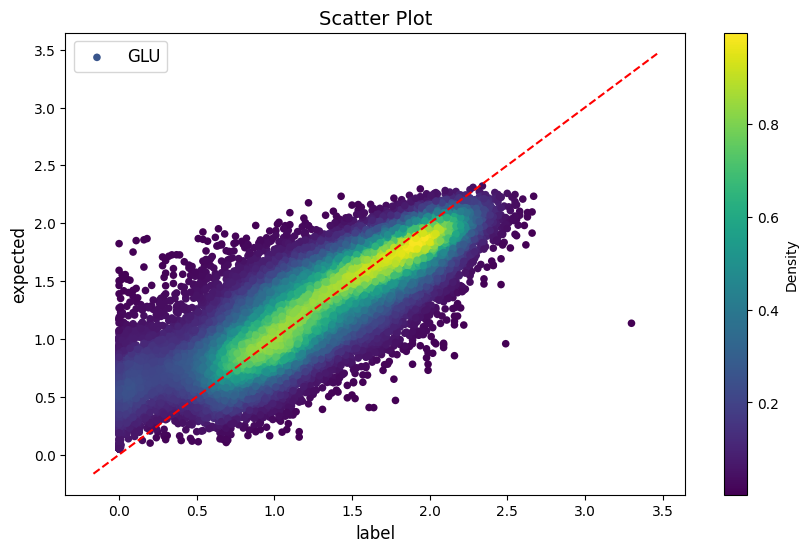

HIS


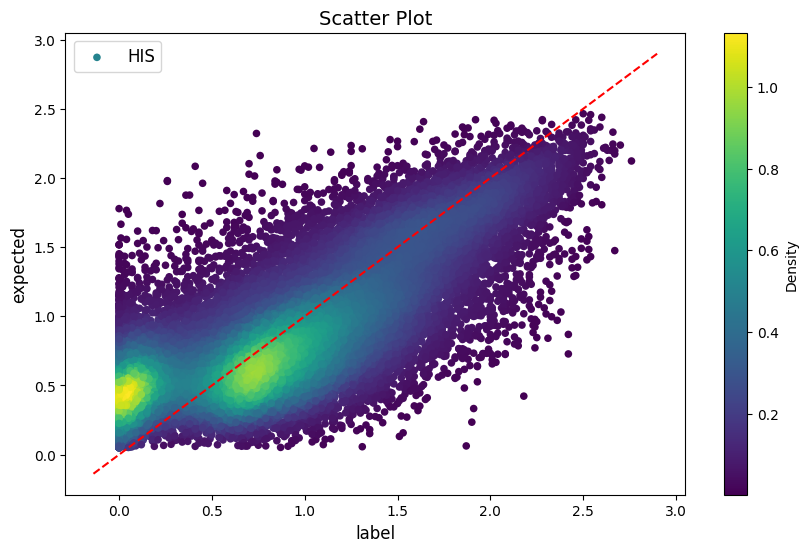

ILE


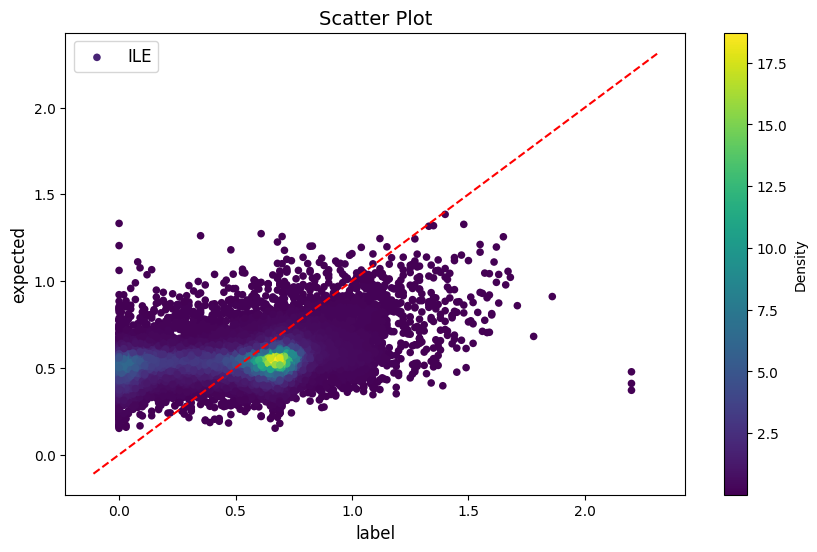

LEU


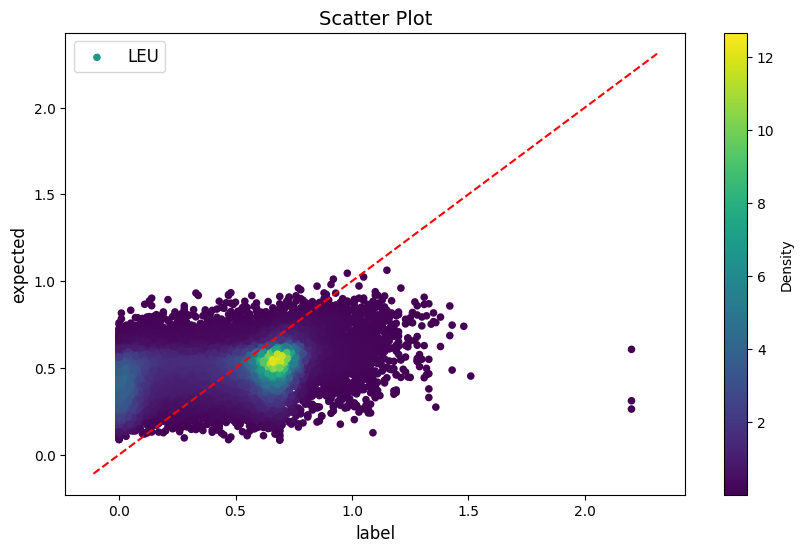

LYS


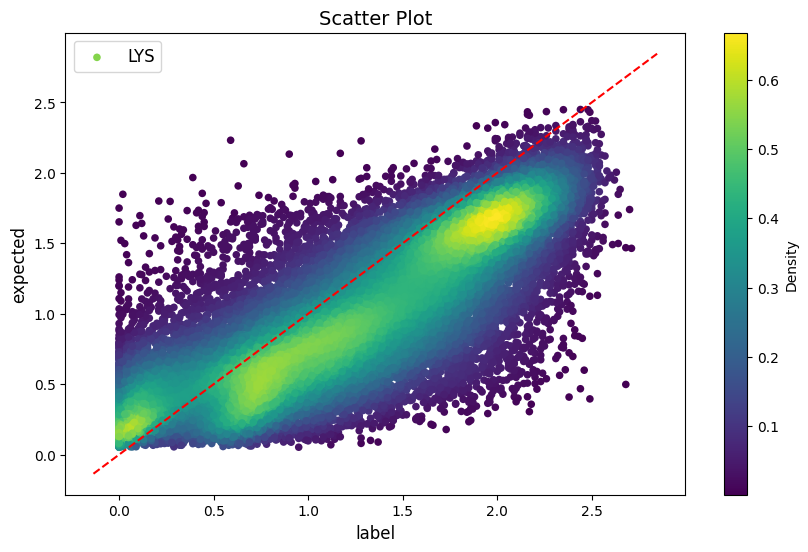

MET


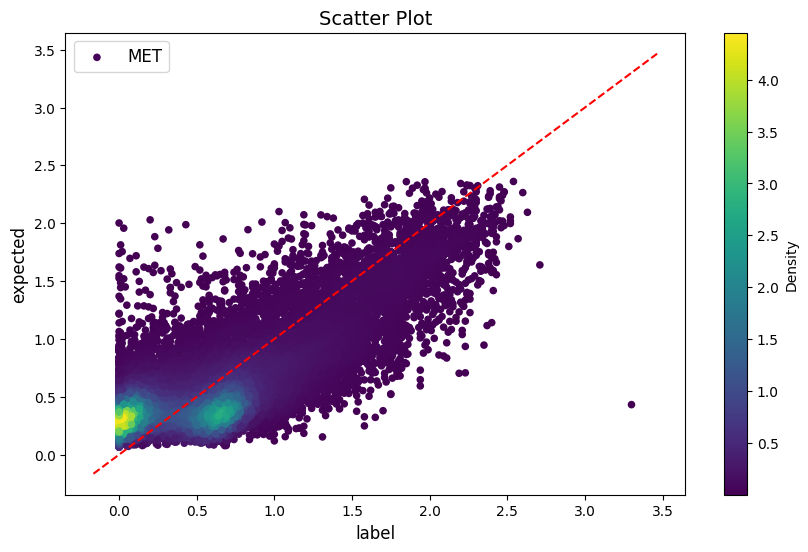

PHE


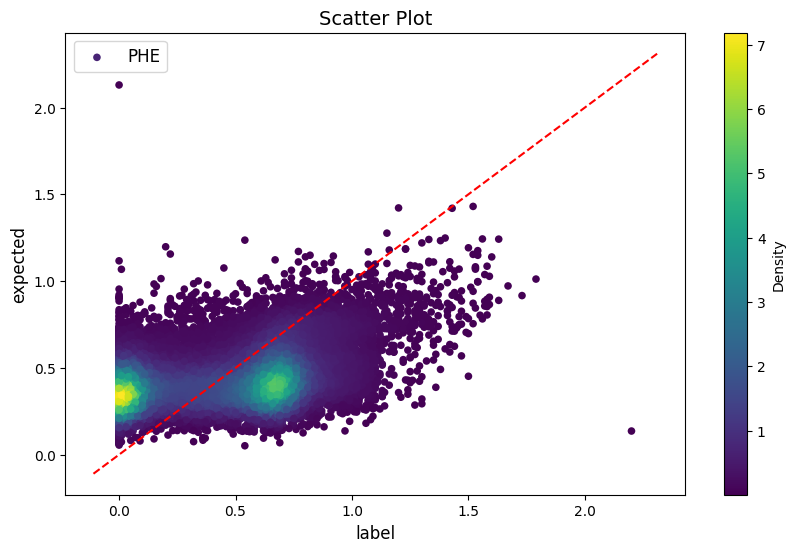

PRO


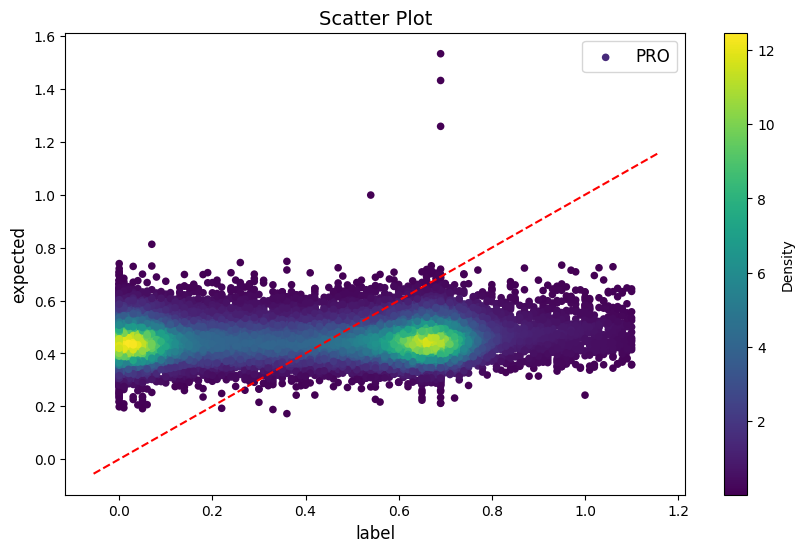

SER


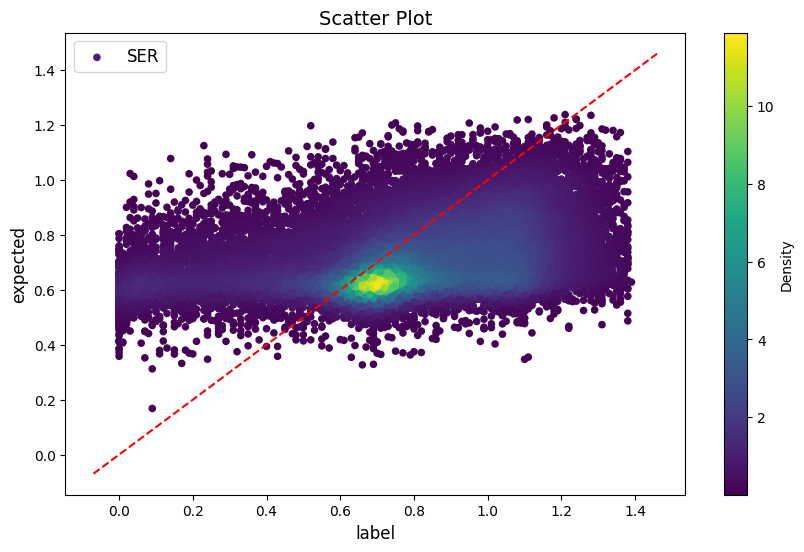

THR


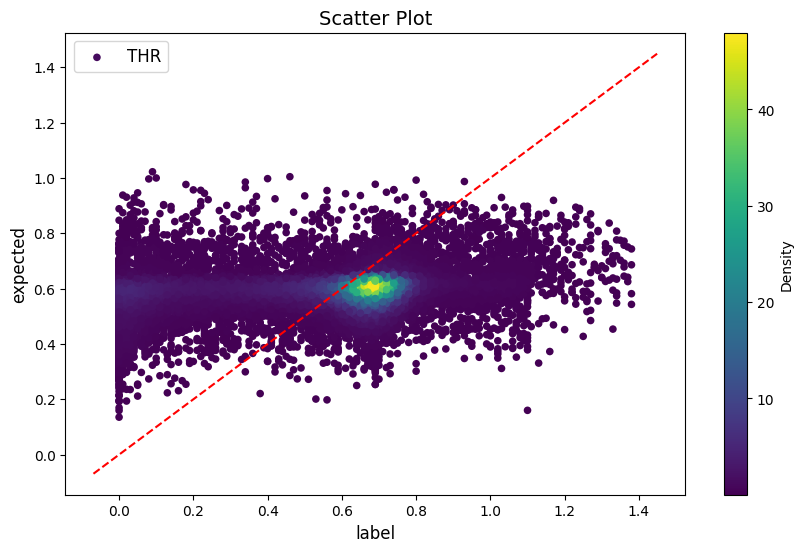

TRP


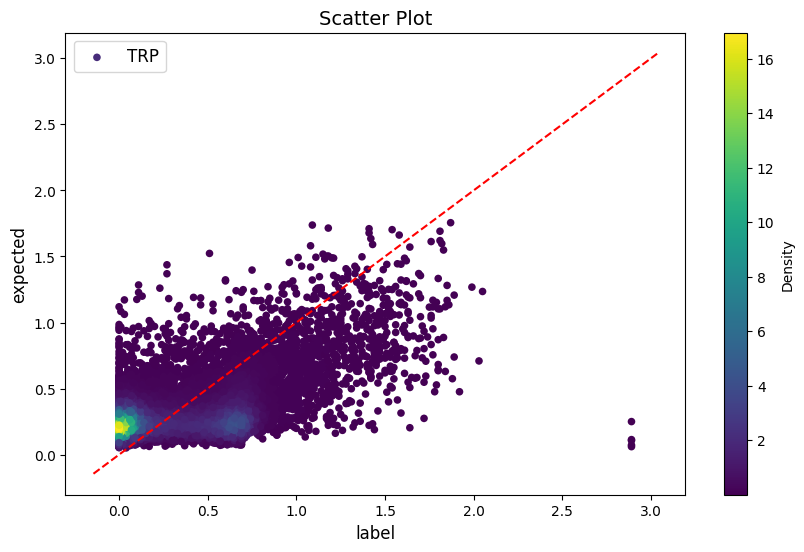

TYR


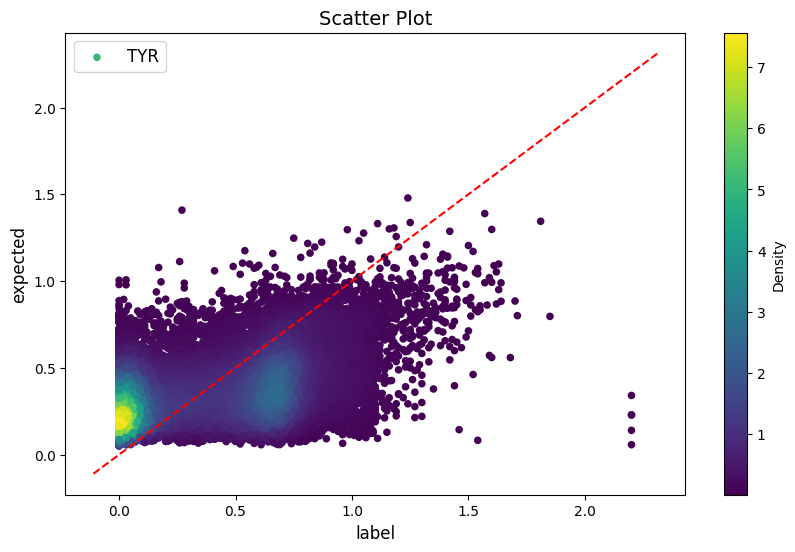

VAL


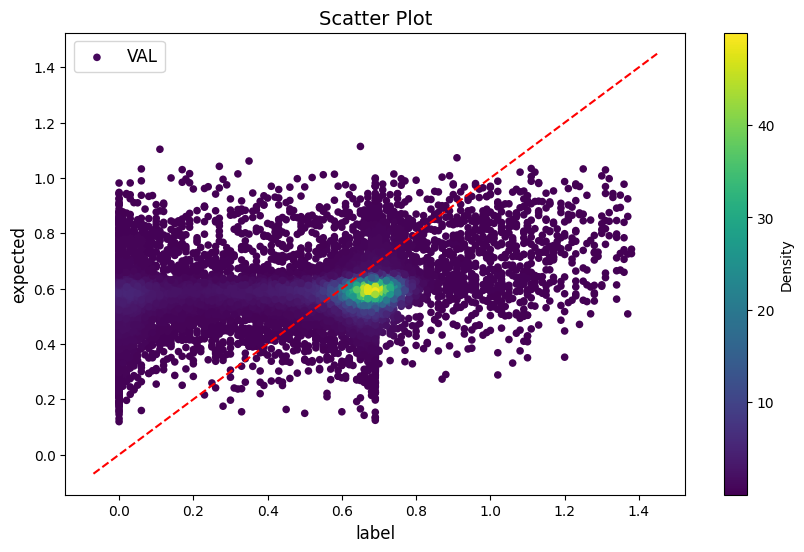

In [55]:

from scipy.stats import gaussian_kde
for name, group in grouped:
    print(name)
    
    plt.figure(figsize=(10,6))
    x=group['label_int']
    y=group['ex_val']
    xy=np.vstack([x,y])
    z=gaussian_kde(xy)(xy)
    scatter=plt.scatter(x,y,c=z,s=30,edgecolors='none',label=f"{name}")

    plt.colorbar(scatter, label='Density')
    space=np.linspace(*plt.xlim(),100)
    
    plt.plot(space,space, 'r--')
    
    plt.title("Scatter Plot", fontsize=14)
    plt.xlabel('label',fontsize=12)
    plt.ylabel('expected', fontsize=12)
    plt.legend(fontsize=12)
    plt.show()

### correlation

In [1]:
from scipy.stats import pearsonr

def pearson_ana(correlation):
    if 0.7<=correlation<=1:
        return "Strong Positive"
    elif 0.3<=correlation<0.7:
        return "Positive"
    elif 0.1<=correlation<0.3:
        return "Weak Positive"
    else:
        return "No Relation or Negative Relation"

In [15]:
file_path = "infer_caesar_0816.csv"

# CSV 파일을 데이터프레임으로 읽어들이기
df = pd.read_csv(file_path)
list_df=df.values.tolist()
print(list_df[:3])
# 데이터프레임 확인
print(df.head(10))

[['1qfn', 'ARG', 'A16', 0.24, 0.9132, 2, 8, 0.4532], ['7r8q', 'PRO', 'A149', 0.31, 0.3574, 3, 0, 0.0022], ['5i80', 'GLN', 'A127', 2.35, 1.8993, 23, 19, 0.2031]]
  proname resname  resno  label_int  ex_val  label_bin  ex_bin    MSE 
0    1qfn     ARG    A16       0.24  0.9132          2       8  0.4532
1    7r8q     PRO   A149       0.31  0.3574          3       0  0.0022
2    5i80     GLN   A127       2.35  1.8993         23      19  0.2031
3    2rh3     MET   A157       0.90  1.3859          8      15  0.2361
4    2vhw     VAL   A196       0.56  0.4771          5       6  0.0069
5    4b45     ARG   A324       0.02  0.4082          0       0  0.1507
6    2iuk     PRO  B1756       0.36  0.4081          3       0  0.0023
7    6z3y     ASN   B369       0.88  0.7097          8       6  0.0290
8    3w5n     PRO   A297       0.01  0.4785          0       0  0.2195
9    3sjf     TRP   A410       0.25  0.1967          2       0  0.0028


In [16]:
count=0
bad=[]
grouped = df.groupby('resname')
for name, group in grouped:
    if type(name)==str:
        print(name)
        correlation,p_value=pearsonr(group['label_int'],group['ex_val'])
        print("Corr:", round(correlation,4))
        if correlation < 0.3:
            bad.append(name)
        print("p_value:", round(p_value,4))
        print(pearson_ana(correlation))
        
        if p_value>0.8:
            print(name)
        else:
            print("p_value: Invalid")
        count+=correlation
        print()
    print(count/18)
print(bad)

ARG
Corr: 0.8433
p_value: 0.0
Strong Positive
p_value: Invalid

0.04684762357206254
ASN
Corr: 0.6429
p_value: 0.0
Positive
p_value: Invalid

0.08256190738542885
ASP
Corr: 0.5042
p_value: 0.0
Positive
p_value: Invalid

0.11057124129159807
CYS
Corr: 0.4551
p_value: 0.0
Positive
p_value: Invalid

0.1358519049599701
GLN
Corr: 0.8209
p_value: 0.0
Strong Positive
p_value: Invalid

0.18145722384718802
GLU
Corr: 0.808
p_value: 0.0
Strong Positive
p_value: Invalid

0.22634436148322262
HIS
Corr: 0.7407
p_value: 0.0
Strong Positive
p_value: Invalid

0.26749219578476335
ILE
Corr: 0.3523
p_value: 0.0
Positive
p_value: Invalid

0.2870667110385209
LEU
Corr: 0.3929
p_value: 0.0
Positive
p_value: Invalid

0.3088934906153518
LYS
Corr: 0.7718
p_value: 0.0
Strong Positive
p_value: Invalid

0.35176925550300425
MET
Corr: 0.7643
p_value: 0.0
Strong Positive
p_value: Invalid

0.39423312047479214
PHE
Corr: 0.4132
p_value: 0.0
Positive
p_value: Invalid

0.417189749549086
PRO
Corr: 0.0978
p_value: 0.0
No Relatio

In [61]:
pip install scikit-learn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.1/11.1 MB 62.7 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [9]:
from sklearn.metrics import r2_score
count=0
for name, group in grouped:
    print(name)
    r2=round(r2_score(group['label_int'], group['ex_val']),4)
    
    print(r2)
    
    print()
print(r2)

ARG
0.71

ASN
0.4087

ASP
0.2433

CYS
0.2057

GLN
0.6713

GLU
0.6502

HIS
0.5457

ILE
0.0898

LEU
0.1456

LYS
0.4711

MET
0.5839

PHE
0.1671

PRO
-0.0761

SER
0.0741

THR
0.0373

TRP
0.2723

TYR
0.2368

VAL
0.0043

0.0043


### 0624 ana

In [10]:
import pandas as pd
file_path = "MSE_infer_0816.csv"

# CSV 파일을 데이터프레임으로 읽어들이기
df_mse = pd.read_csv(file_path)
list_df=df_mse.values.tolist()
print(list_df[:3])
# 데이터프레임 확인
print(df_mse.head(10))

[['1qfn', 'ARG', 'A16', 0.24, 0.9132, 2, 8, 0.4532], ['7r8q', 'PRO', 'A149', 0.31, 0.3574, 3, 0, 0.0022], ['5i80', 'GLN', 'A127', 2.35, 1.8993, 23, 19, 0.2031]]
  proname resname  resno  label_int  ex_val  label_bin  ex_bin     MSE
0    1qfn     ARG    A16       0.24  0.9132          2       8  0.4532
1    7r8q     PRO   A149       0.31  0.3574          3       0  0.0022
2    5i80     GLN   A127       2.35  1.8993         23      19  0.2031
3    2rh3     MET   A157       0.90  1.3859          8      15  0.2361
4    2vhw     VAL   A196       0.56  0.4771          5       6  0.0069
5    4b45     ARG   A324       0.02  0.4082          0       0  0.1507
6    2iuk     PRO  B1756       0.36  0.4081          3       0  0.0023
7    6z3y     ASN   B369       0.88  0.7097          8       6  0.0290
8    3w5n     PRO   A297       0.01  0.4785          0       0  0.2195
9    3sjf     TRP   A410       0.25  0.1967          2       0  0.0028


In [14]:
grouped_mse = df_mse.groupby('resname')
count=0
for name, group in grouped_mse:
    if type(name)==str:
        print(name)
        correlation,p_value=pearsonr(group['label_int'],group['ex_val'])
        print("Corr:", round(correlation,4))
        if correlation < 0.3:
            bad.append(name)
        print("p_value:", round(p_value,4))
        print(pearson_ana(correlation))
        
        if p_value>0.8:
            print(name)
        else:
            print("p_value: Invalid")
        count+=correlation
        print()
print(count/18)

ARG
Corr: 0.8433
p_value: 0.0
Strong Positive
p_value: Invalid

ASN
Corr: 0.6429
p_value: 0.0
Positive
p_value: Invalid

ASP
Corr: 0.5042
p_value: 0.0
Positive
p_value: Invalid

CYS
Corr: 0.4551
p_value: 0.0
Positive
p_value: Invalid

GLN
Corr: 0.8209
p_value: 0.0
Strong Positive
p_value: Invalid

GLU
Corr: 0.808
p_value: 0.0
Strong Positive
p_value: Invalid

HIS
Corr: 0.7407
p_value: 0.0
Strong Positive
p_value: Invalid

ILE
Corr: 0.3523
p_value: 0.0
Positive
p_value: Invalid

LEU
Corr: 0.3929
p_value: 0.0
Positive
p_value: Invalid

LYS
Corr: 0.7718
p_value: 0.0
Strong Positive
p_value: Invalid

MET
Corr: 0.7643
p_value: 0.0
Strong Positive
p_value: Invalid

PHE
Corr: 0.4132
p_value: 0.0
Positive
p_value: Invalid

PRO
Corr: 0.0978
p_value: 0.0
No Relation or Negative Relation
p_value: Invalid

SER
Corr: 0.347
p_value: 0.0
Positive
p_value: Invalid

THR
Corr: 0.231
p_value: 0.0
Weak Positive
p_value: Invalid

TRP
Corr: 0.5238
p_value: 0.0
Positive
p_value: Invalid

TYR
Corr: 0.4909
p_v

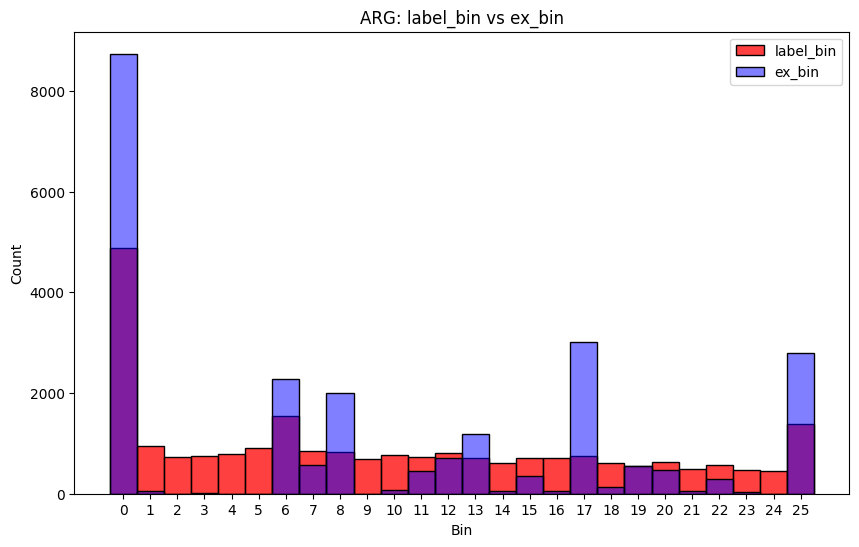

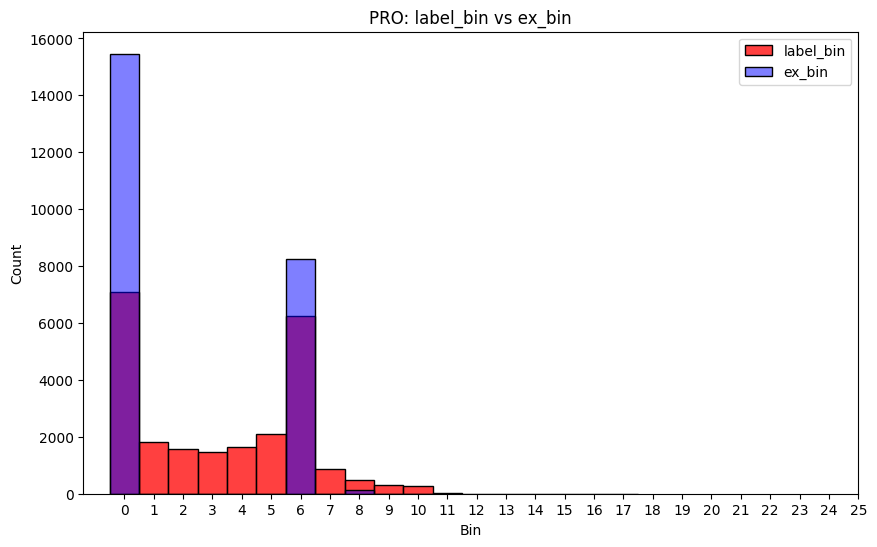

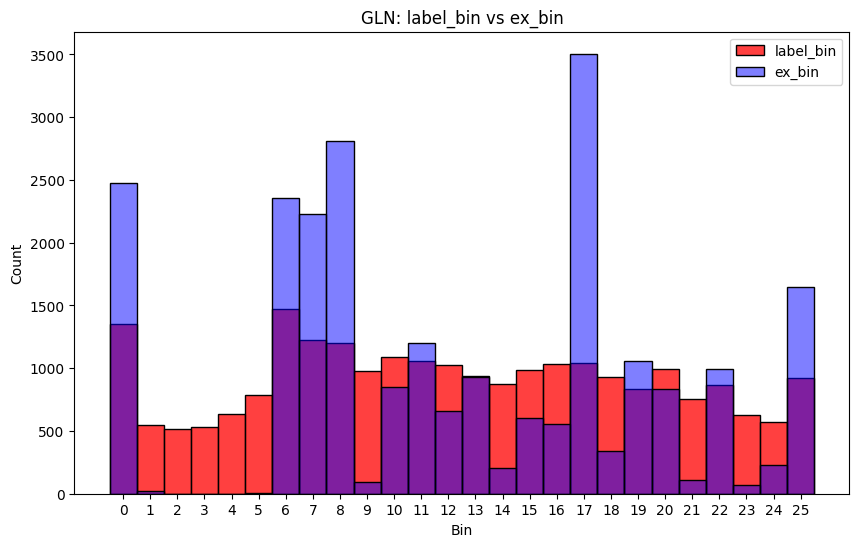

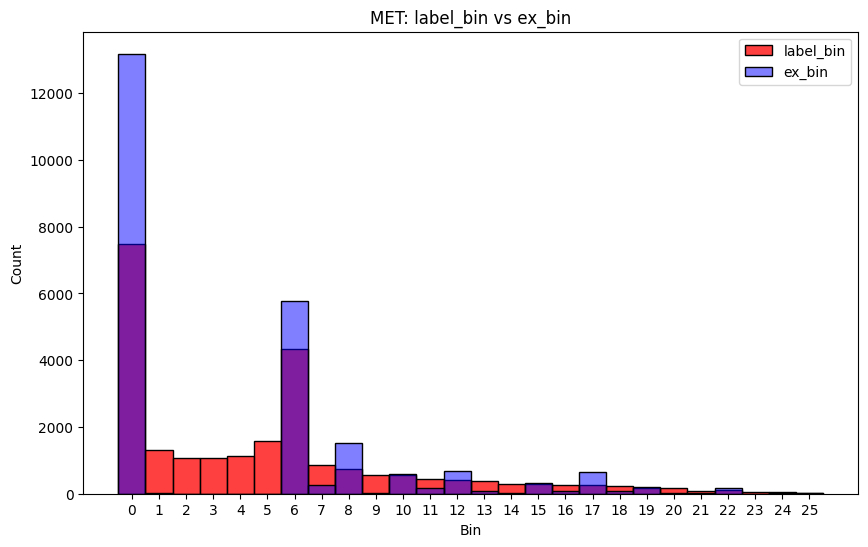

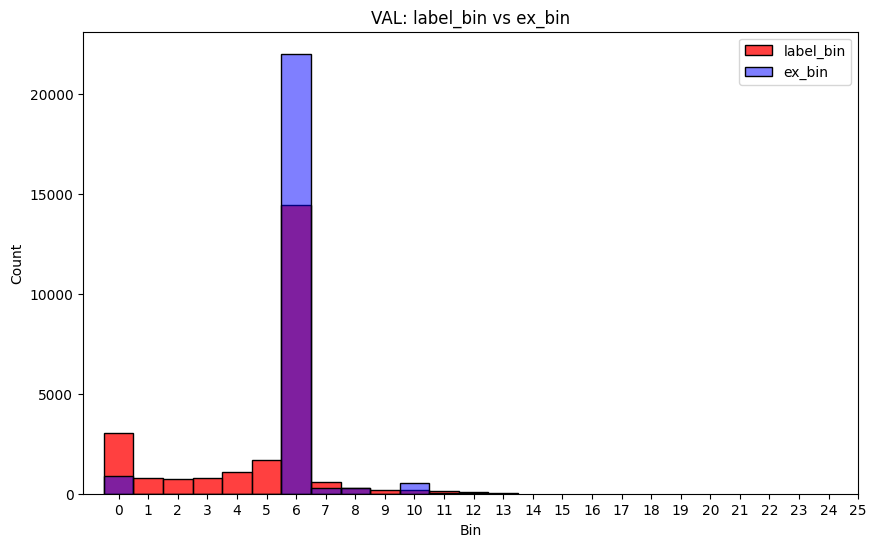

...

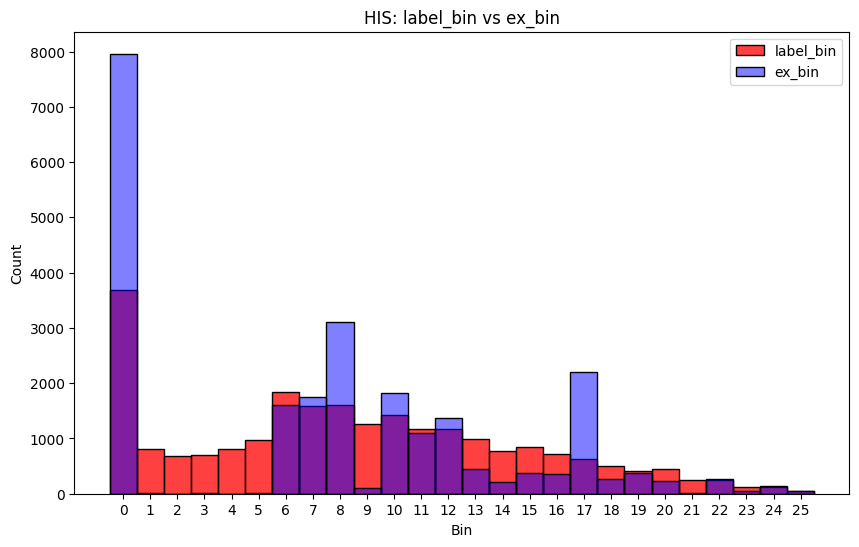

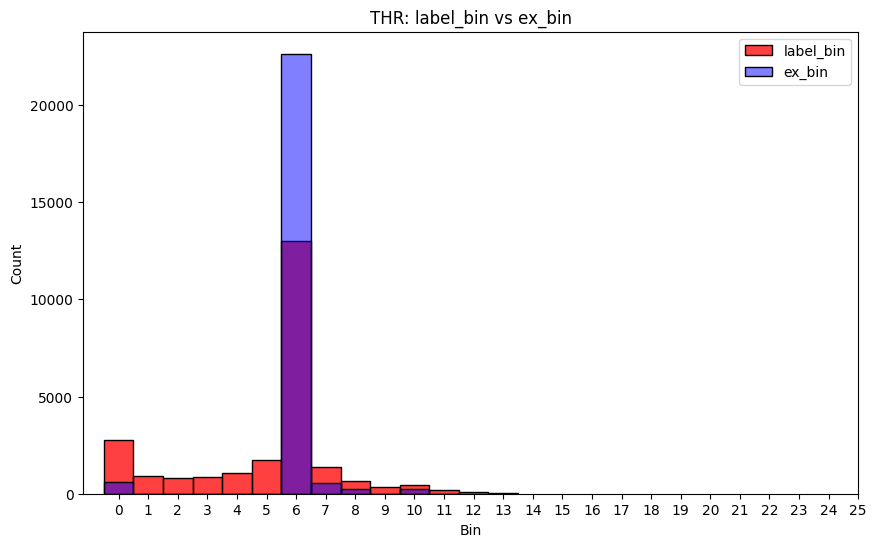

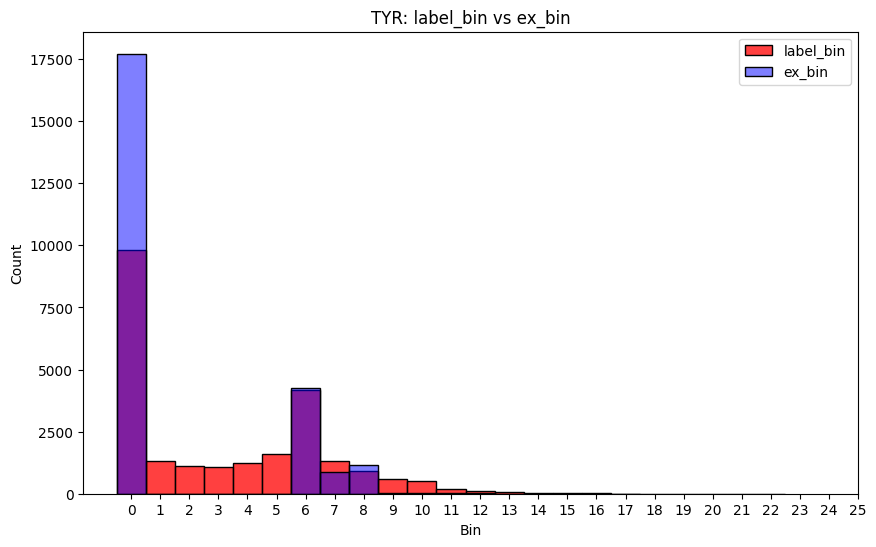

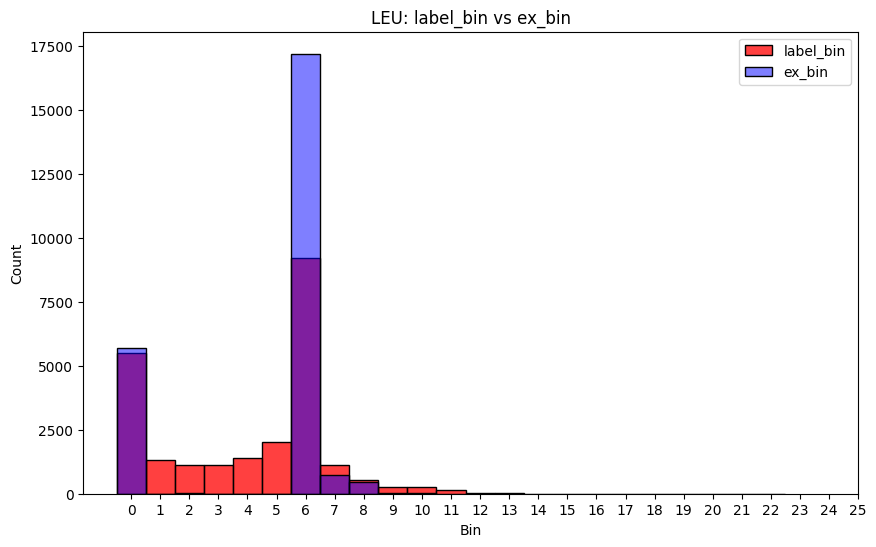

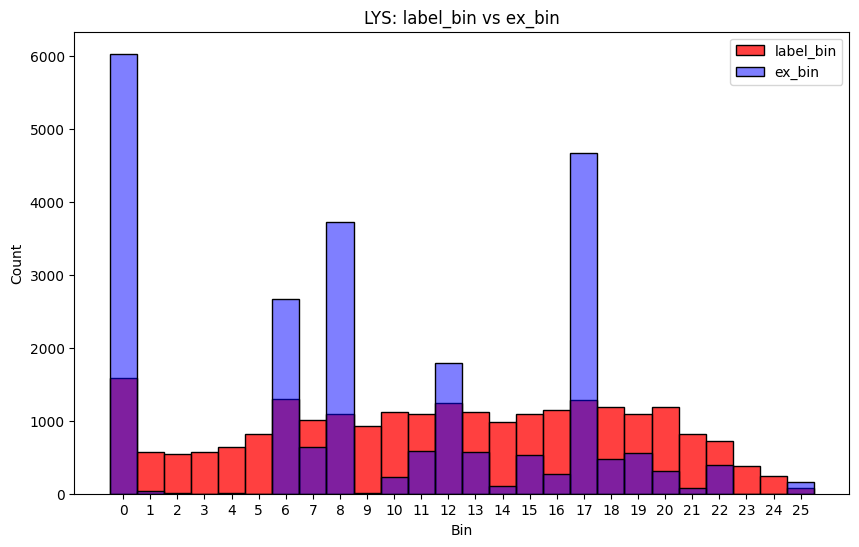

In [14]:
def plot_bin_comparison_separate(df):
    unique_resnames = df["resname"].unique()
    
    for resname in unique_resnames:
        subset = df[df["resname"] == resname]
        
        plt.figure(figsize=(10, 6))
        sns.histplot(subset["label_bin"], bins=range(27), color="red", label="label_bin", kde=False, discrete=True)
        sns.histplot(subset["ex_bin"], bins=range(27), color="blue", label="ex_bin", kde=False, discrete=True, alpha=0.5)
        plt.title(f'{resname}: label_bin vs ex_bin')
        plt.xlabel('Bin')
        plt.ylabel('Count')
        plt.xticks(range(26))
        plt.legend()
        plt.show()

# 플롯 그리기
plot_bin_comparison_separate(df_mse)

### Accuracy comparision

In [ ]:
def acc_change(acc_list, df_acc, df_resname):
    x = np.arange(len(df_resname))
    width = 0.35  # 막대의 너비

    fig, ax = plt.subplots(figsize=(20, 6))
    rects1 = ax.bar(x - width/2, df_acc, width, label='Accuracy')
    rects2 = ax.bar(x + width/2, acc_list,width, label='Gen_Accuracy')
    
    for rect, pred, label in zip(rects1, df_acc, acc_list):
        height=rect.get_height()
        ax.text(rect.get_x() + rect.get_width()/2, height, '{:.2f}'.format(pred*100), ha='right', va='bottom')
    
    for rect, label in zip(rects2, acc_list):
        height=rect.get_height()
        ax.text(rect.get_x() + rect.get_width()/2, height, '{:.2f}'.format(label*100), ha='center', va='bottom')

    ax.set_xlabel('Resname')
    ax.set_ylabel('Accuracy(%)')
    ax.set_title('Accuracy Change')
    ax.set_xticks(x)
    ax.set_xticklabels(df_resname)
    ax.legend(loc='lower right')

    plt.show()
    
acc_change(acc_list, df_acc, df_resname)

0         0
1         0
2         0
3         0
4         0
         ..
430416    0
430417    1
430418    1
430419    0
430420    0
Name: correct_prediction, Length: 430421, dtype: int64


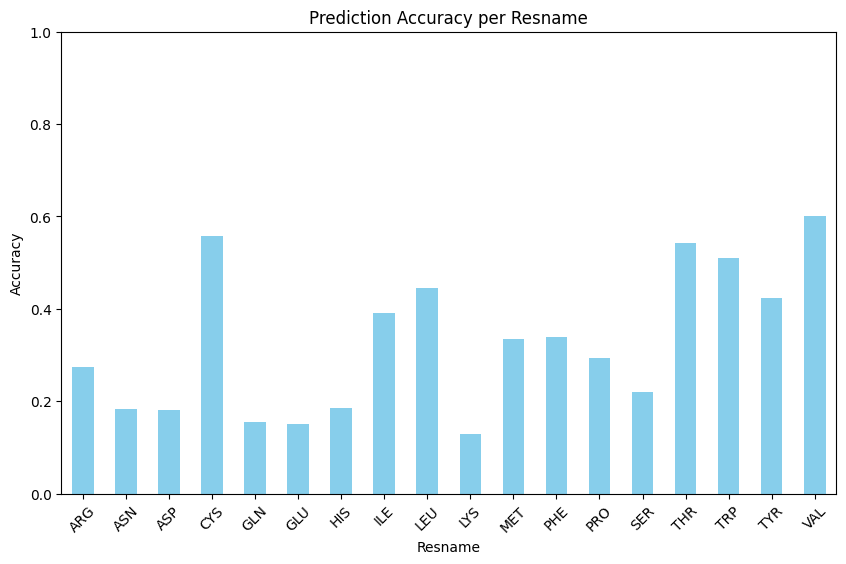

In [16]:
df_test=df_mse

# 각 resname에 대해 일치하는 예측 비율 계산
df_test['correct_prediction'] = (df_test['label_bin'] == df_test['ex_bin']).astype(int)
print(df_test['correct_prediction'])
accuracy_per_resname = df_test.groupby('resname')['correct_prediction'].mean()

# 시각화
plt.figure(figsize=(10, 6))
accuracy_per_resname.plot(kind='bar', color='skyblue')
plt.title('Prediction Accuracy per Resname')
plt.xlabel('Resname')
plt.ylabel('Accuracy')
plt.ylim(0, 1)  # 정확도는 0에서 1 사이
plt.xticks(rotation=45)
plt.show()

### Outlier Check

In [25]:
out_resname=[]
#proname,resname,resno,label_int,ex_val,label,argmax,MSE
#print(type(list_df))
file='infer_caesar_0816.csv'
df_new=pd.read_csv(file)
list_df=df_new.values.tolist()
for i in range(len(list_df)):
    if abs(list_df[i][3]-list_df[i][4]>0.5):
        proname= list_df[i][0]
        resname= list_df[i][1]
        resno= list_df[i][2]
        label_int=list_df[i][3]
        ex_val=list_df[i][4]
        value=(list_df[i][3]-list_df[i][4])
        label=list_df[i][5]
        argmax=list_df[i][6]
        out_resname.append([proname, resno, resname, label_int,ex_val,value,label,argmax])
        
col_name=['proname','resno','resname','label_int','ex_val','value','label','argmax']
df_outlier=pd.DataFrame(out_resname, columns=col_name)
print(df_outlier)

      proname  resno resname  label_int  ex_val   value  label  argmax
0        1w7p   D506     ASN       1.78  0.8647  0.9153     17       8
1        2wly    A78     LYS       0.84  0.3105  0.5295      8       0
2        3ffg   A186     LYS       1.92  1.0026  0.9174     19       8
3        4ews   A244     ASP       1.50  0.7267  0.7733     15       7
4        7uxg   A187     TYR       0.83  0.1828  0.6472      8       0
...       ...    ...     ...        ...     ...     ...    ...     ...
24518    4pn2   A154     TYR       0.60  0.0853  0.5147      6       0
24519    1gc3  F2800     ARG       0.67  0.0732  0.5968      6       0
24520    6ia5    D91     ASN       1.62  0.8457  0.7743     16       6
24521    4e6m   A149     PRO       1.04  0.4156  0.6244     10       0
24522    6f7p   C512     HIS       1.51  0.4886  1.0214     15       0

[24523 rows x 8 columns]


In [26]:
group_resname=df_outlier.groupby('resname')
count=0
for name, group in group_resname:
    #print(name)
    #print(group[['proname','resno','value']])
    group_sort=group.sort_values(by="value",ascending=[False])

    print(name)
    print(group_sort[['proname','resno','label_int','ex_val','value','label','argmax']][:5])
    #count+=1
    print()
#print(count)

ARG
      proname resno  label_int  ex_val   value  label  argmax
11994    1gtv  A190       4.39  0.1522  4.2378     25       0
4012     1gtv  A174       4.39  0.1835  4.2065     25       0
22379    4xty  A253       2.89  0.2196  2.6704     25       0
21794    3rux  A253       2.77  0.1320  2.6380     25       0
11627    4xtx  A253       2.79  0.3421  2.4479     25       0

ASN
      proname  resno  label_int  ex_val   value  label  argmax
15508    5b0w   A265       2.89  0.4584  2.4316     25       0
4710     7koh   A434       2.50  0.9034  1.5966     25       8
14366    7zl4    A44       1.66  0.3482  1.3118     16       0
14009    2hww  A1281       1.91  0.6326  1.2774     19       6
4366     7jmt    A24       1.93  0.7013  1.2287     19       6

ASP
      proname resno  label_int  ex_val   value  label  argmax
5352     5b0w  A209       2.20  0.2941  1.9059     22       0
3376     5b0w   A31       2.20  0.8209  1.3791     22      10
8106     3wtn  A161       1.73  0.5086  1.2214    

##### bad example

In [33]:
out_bad=[]
#proname,resname,resno,label_int,ex_val,label,argmax,MSE
#print(type(list_df))
for i in range(len(list_df)):
    if abs(list_df[i][5]-list_df[i][6])>3:
        proname= list_df[i][0]
        resname= list_df[i][1]
        resno= list_df[i][2]
        label_int=list_df[i][3]
        ex_val=list_df[i][4]
        value=abs(list_df[i][3]-list_df[i][4])
        label=list_df[i][5]
        argmax=list_df[i][6]
        out_bad.append([proname, resno, resname, label_int,ex_val,value,label,argmax])
        
col_name=['proname','resno','resname','label_int','expected','value','label','argmax']

df_bad=pd.DataFrame(out_bad, columns=col_name)
group_sort=df_bad.sort_values(by="value",ascending=False)
print(df_bad)

       proname  resno resname  label_int  expected   value  label  argmax
0         1qfn    A16     ARG       0.24    0.9132  0.6732      2       8
1         5i80   A127     GLN       2.35    1.8993  0.4507     23      19
2         2rh3   A157     MET       0.90    1.3859  0.4859      8      15
3         4tsd    B72     GLU       1.95    1.4638  0.4862     19      14
4         1w7p   D506     ASN       1.78    0.8647  0.9153     17       8
...        ...    ...     ...        ...       ...     ...    ...     ...
142973    3inb   A566     LEU       0.00    0.4344  0.4344      0       6
142974    2ri9  A1288     LYS       0.65    0.2217  0.4283      6       0
142975    7ubk   A114     PRO       0.68    0.4914  0.1886      6       0
142976    4cvq    A48     PHE       0.63    0.2707  0.3593      6       0
142977    8a6z   A383     GLU       1.10    1.7941  0.6941     11      19

[142978 rows x 8 columns]


##### PRO Extract

In [34]:
df_pro = df_bad.groupby("resname")

for name, grouped in df_pro:
    if name =='PRO':
        group_sort=grouped.sort_values(by="value",ascending=False)
        print(group_sort)
    

       proname  resno resname  label_int  expected   value  label  argmax
125601    4y79   A124     PRO       0.69    1.5333  0.8433      6      17
130465    7ou3   A127     PRO       1.00    0.2422  0.7578     10       0
43396     3b78   A608     PRO       1.10    0.3563  0.7437     11       0
1234      1jma    B63     PRO       0.07    0.8127  0.7427      0       8
73979     2y82   A124     PRO       0.69    1.4321  0.7421      6      16
...        ...    ...     ...        ...       ...     ...    ...     ...
64264     7zcc   A219     PRO       0.41    0.4103  0.0003      4       0
64571     5fpw  B1058     PRO       0.46    0.4597  0.0003      4       0
31885     5f54   A532     PRO       0.48    0.4798  0.0002      4       0
101238    2ya1  A1112     PRO       0.44    0.4398  0.0002      4       0
140231    6vx4   C136     PRO       0.44    0.4402  0.0002      4       0

[11190 rows x 8 columns]


### VAl Extract

In [35]:
for name, grouped in df_pro:
    if name == 'VAL':
        group_sort=grouped.sort_values(by="value",ascending=False)
        print(group_sort)

       proname  resno resname  label_int  expected   value  label  argmax
19751     7cgp   B302     VAL       0.11    1.1037  0.9937      1      12
47696     5t1o   B400     VAL       0.00    0.9816  0.9816      0      10
17278     1bts     A3     VAL       0.06    1.0326  0.9726      0      10
83455     5ztz    A99     VAL       0.03    0.9819  0.9519      0      10
118922    3sds   A103     VAL       0.00    0.9478  0.9478      0       8
...        ...    ...     ...        ...       ...     ...    ...     ...
111511    8dmh   a309     VAL       0.55    0.5400  0.0100      5       0
102726    6u1x  A1614     VAL       0.46    0.4662  0.0062      4       0
55608     3lkd   A166     VAL       0.68    0.6836  0.0036      6      10
21879     2wim    A34     VAL       0.44    0.4410  0.0010      4       0
26856     5jnp   A445     VAL       0.70    0.6998  0.0002      6      10

[4888 rows x 8 columns]


### balance check

In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os

In [11]:
file_list=os.listdir('/home/kathy531/Caesar/code/notebooks/balance_file/csvfiles')
file_list
#df_arg=pd.read_csv(file)

['ILE_bal.csv',
 'MET_bal.csv',
 'SER_bal.csv',
 'PHE_bal.csv',
 'THR_bal.csv',
 'CYS_bal.csv',
 'GLN_bal.csv',
 'ASP_bal.csv',
 'LYS_bal.csv',
 'TYR_bal.csv',
 'VAL_bal.csv',
 'ASN_bal.csv',
 'ARG_bal.csv',
 'HIS_bal.csv',
 'LEU_bal.csv',
 'GLU_bal.csv',
 'TRP_bal.csv']

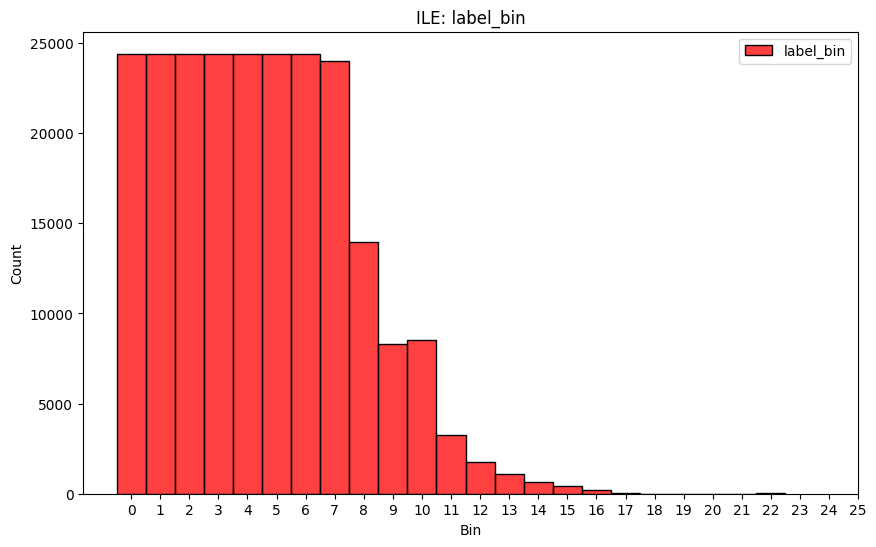

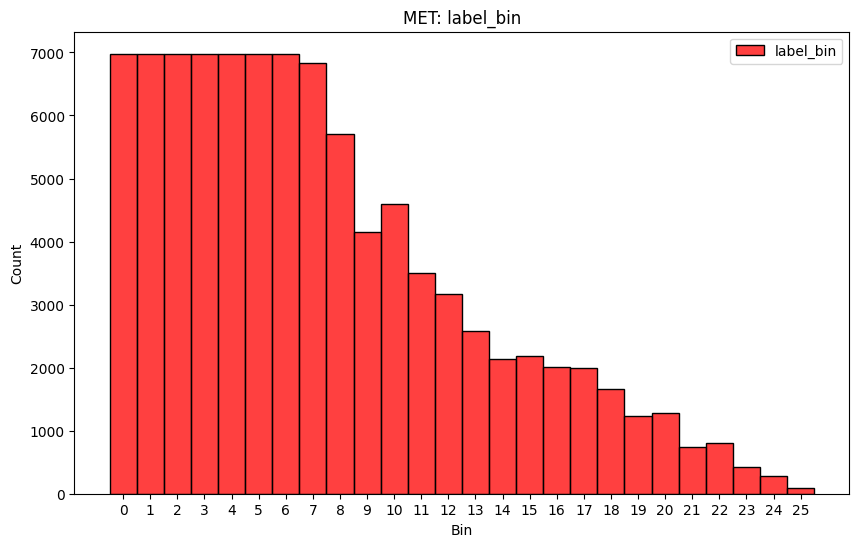

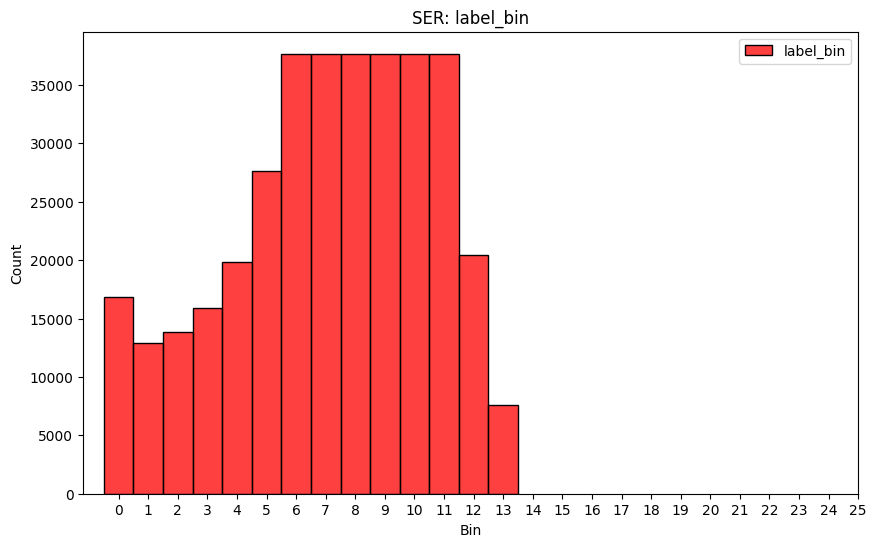

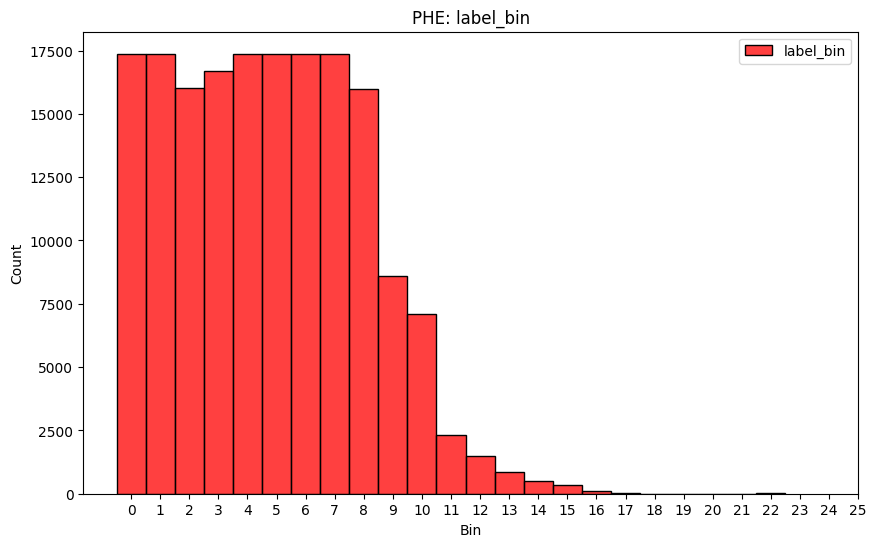

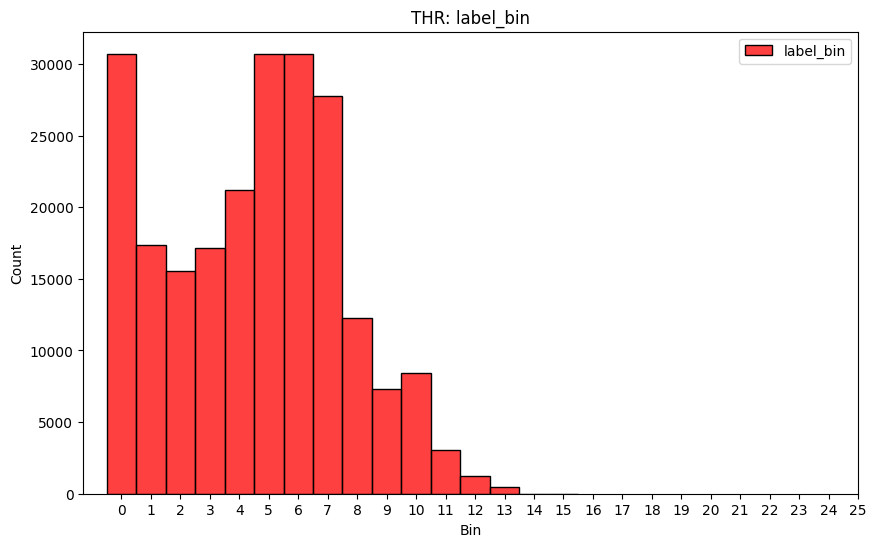

...

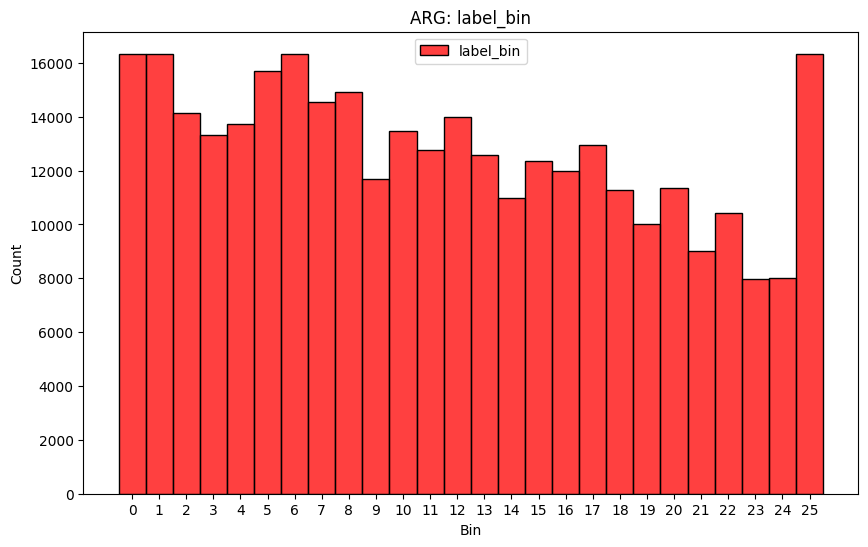

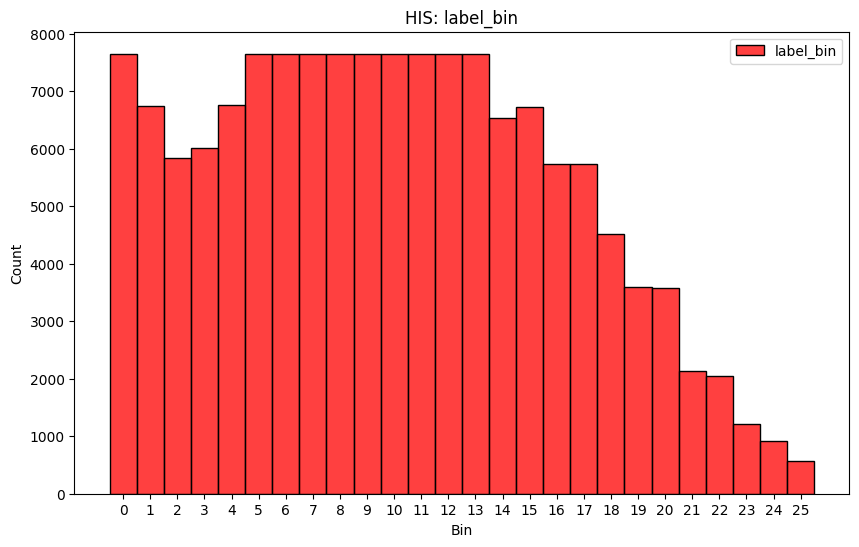

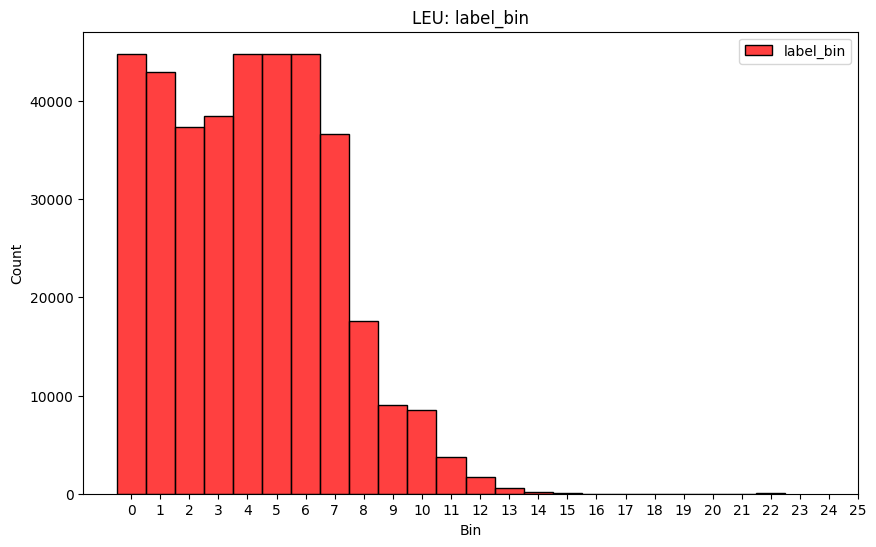

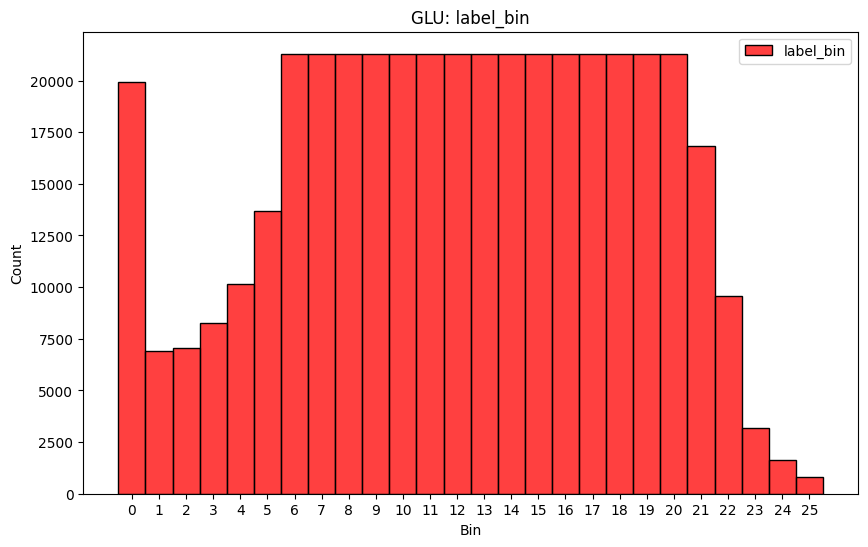

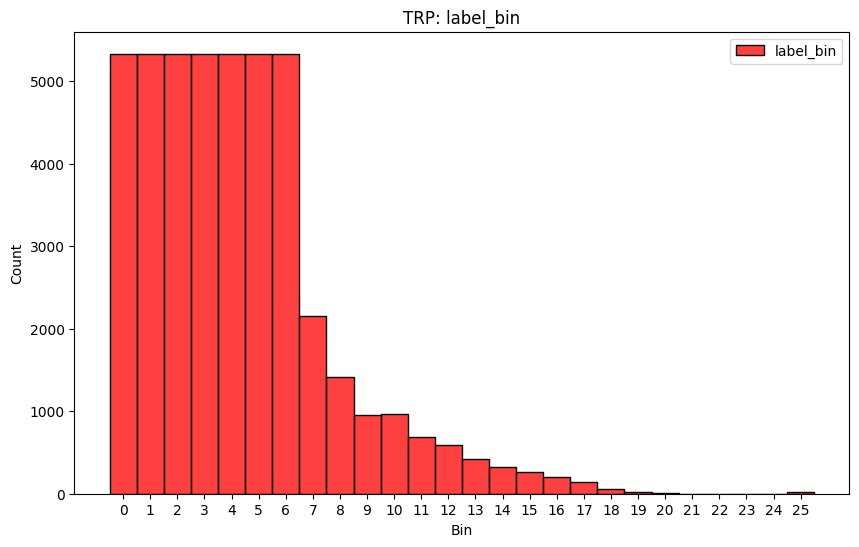

In [16]:
def plot_bin_comparison(df):
    unique_resnames = df["resname"].unique()
    
    for resname in unique_resnames:
        subset = df[df["resname"] == resname]
        
        plt.figure(figsize=(10, 6))
        sns.histplot(subset["label_bin"], bins=range(27), color="red", label="label_bin", kde=False, discrete=True)
        plt.title(f'{resname}: label_bin')
        plt.xlabel('Bin')
        plt.ylabel('Count')
        plt.xticks(range(26))
        plt.legend()
        plt.show()

# 플롯 그리기
for file in file_list:
    df_arg = pd.read_csv(f'/home/kathy531/Caesar/code/notebooks/balance_file/csvfiles/{file}')
    plot_bin_comparison(df_arg)

### 0820 data dist.

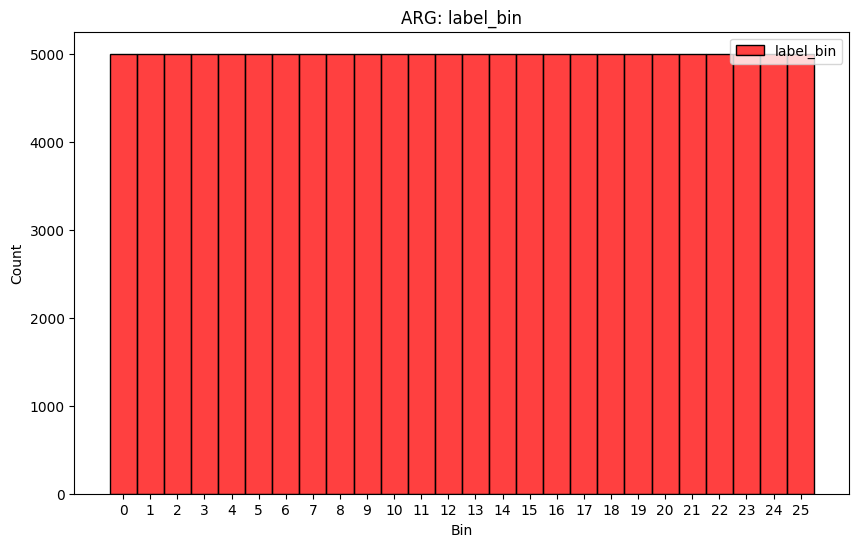

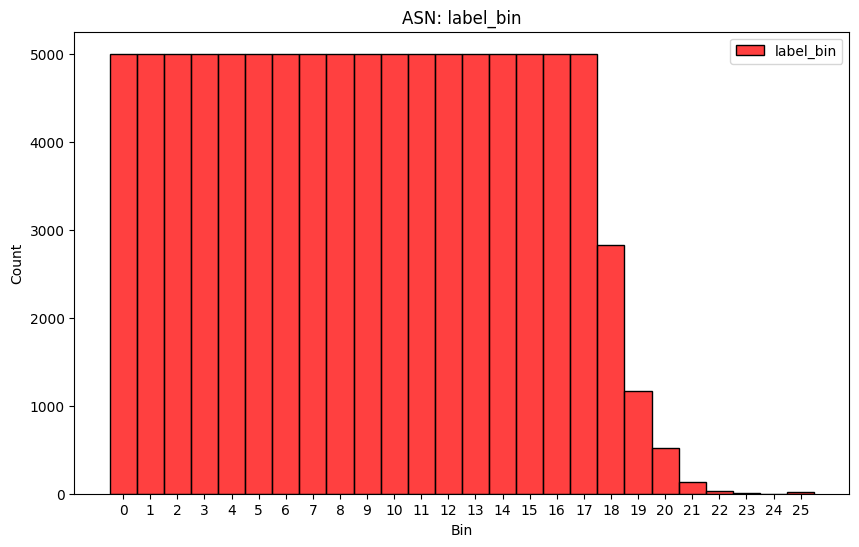

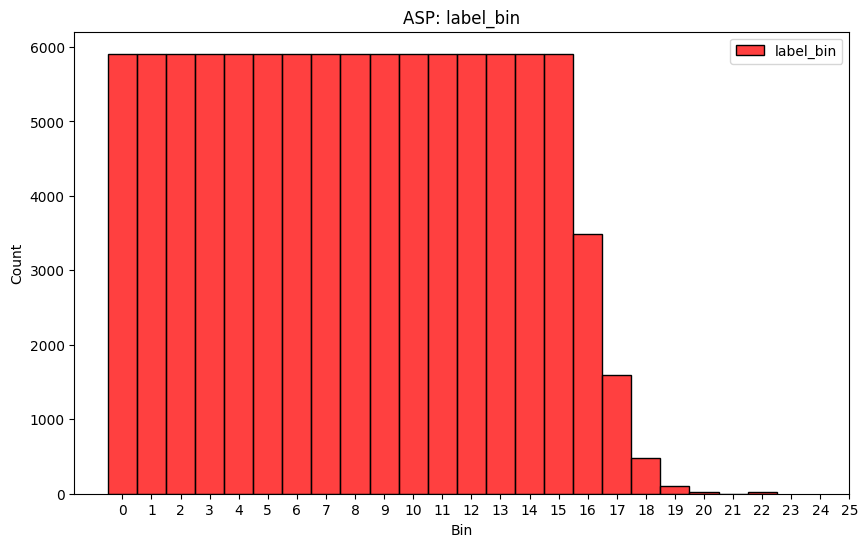

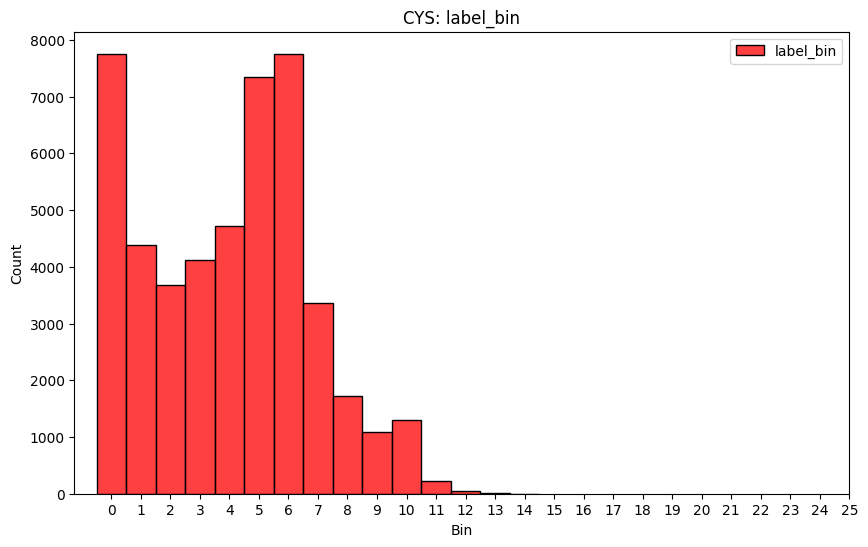

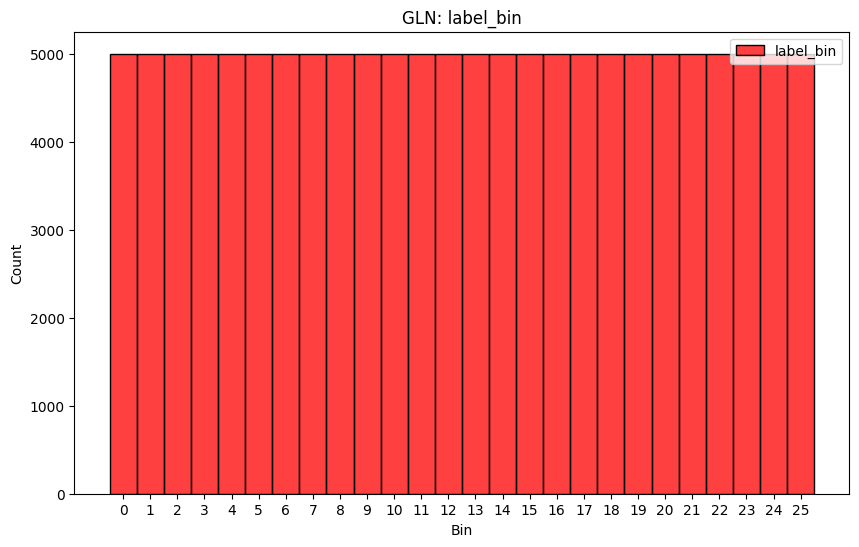

...

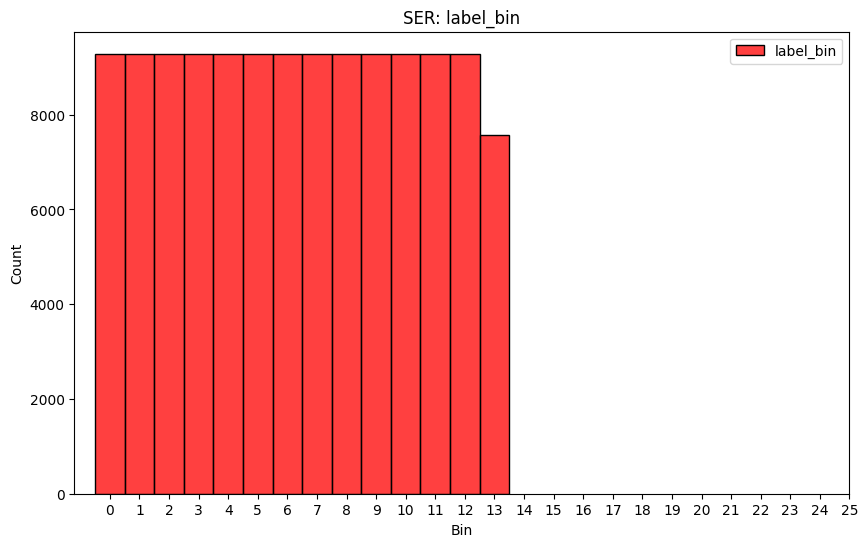

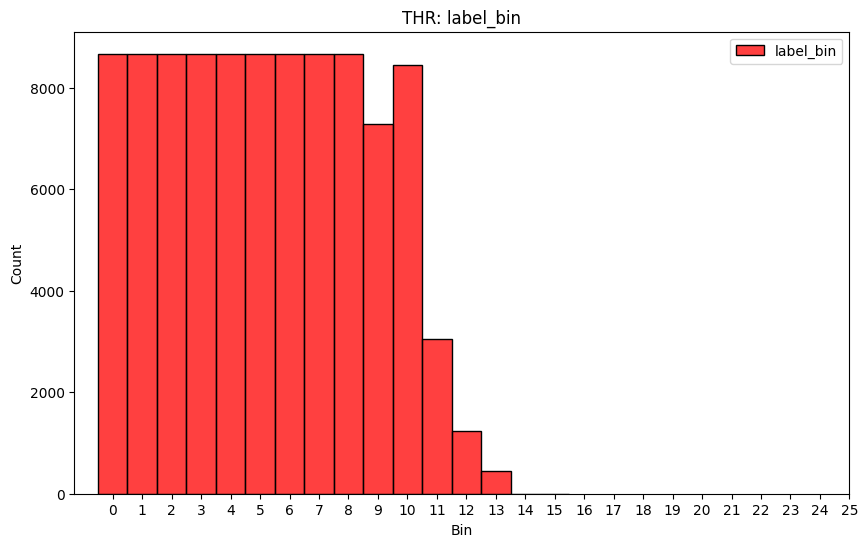

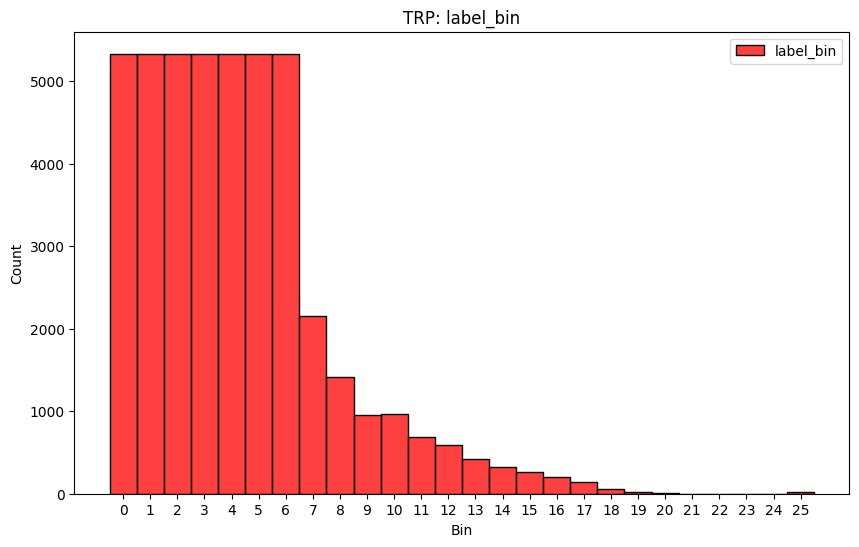

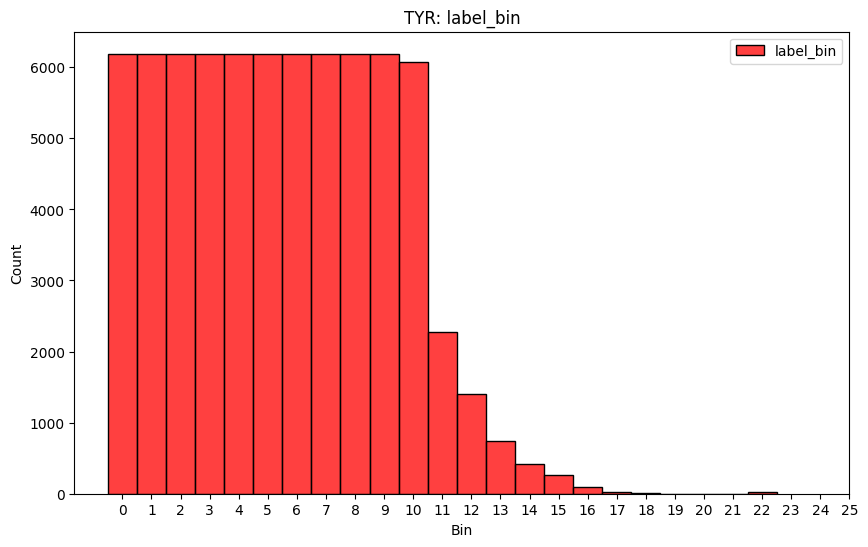

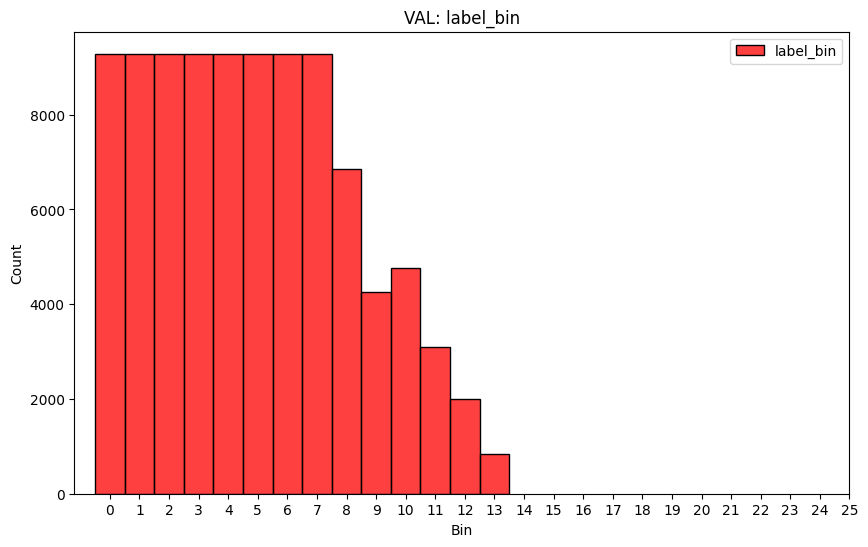

In [20]:
def plot_bin_comparison(df):
    unique_resnames = df["resname"].unique()
    
    for resname in unique_resnames:
        subset = df[df["resname"] == resname]
        
        plt.figure(figsize=(10, 6))
        sns.histplot(subset["label_bin"], bins=range(27), color="red", label="label_bin", kde=False, discrete=True)
        plt.title(f'{resname}: label_bin')
        plt.xlabel('Bin')
        plt.ylabel('Count')
        plt.xticks(range(26))
        plt.legend()
        plt.show()

# 플롯 그리기

df_aa = pd.read_csv(f'/home/kathy531/Caesar/code/notebooks/balance_file/balanced_AA.csv')
grouping = df_aa.groupby('resname')
for name, grouped in grouping:
    
    plot_bin_comparison(grouped)